In [ ]:
#@title 1. Install Dependencies
!pip install ultralytics opencv-python-headless transformers accelerate gradio torch safetensors bitsandbytes -q -U einops numpy gensim scikit-learn
!pip install langchain langchain-openai torch torchvision openai --quiet
!pip install langchain_community
!pip install --upgrade langchain-openai

In [ ]:
!pip install diffusers

# load dataset

我们会 load 两个文件夹, 一个是 train2024(images), 另一个是 annotations_trainval2014 (captions 以及 caption query index)

In [ ]:
!wget http://images.cocodataset.org/zips/train2014.zip
!unzip train2014.zip

In [ ]:
!wget http://images.cocodataset.org/annotations/annotations_trainval2014.zip
!unzip annotations_trainval2014.zip


# Step 0: 数据预处理. 抽取前 `K`(batchsize) 张 images, 以及它们对应的第一个 caption, 即 `K` 个 (image,caption) pair.

In [ ]:
from pycocotools.coco import COCO
import json
ann_path = 'annotations/captions_train2014.json'
coco = COCO(ann_path)
with open('annotations/captions_train2014.json', 'r') as f:
    data = json.load(f)

start = 30000  # start index
batch_size = 1000

image_caption_pairs = []
for i in range(start, start+batch_size):
  image_entry = data["images"][i]

  current_image_filename = "train2014/" + image_entry["file_name"]
  current_image_id = image_entry["id"]
  print("Current image: ", current_image_filename," id: ",current_image_id)

  current_ann_ids = coco.getAnnIds(imgIds=current_image_id)
  current_caption = coco.loadAnns(current_ann_ids)[0]['caption']
  current_caption_id = coco.loadAnns(current_ann_ids)[0]['id']
  print("Current caption: ", current_caption," id: ", current_caption_id)

  image_caption_pairs.append((current_image_filename, current_image_id, current_caption, current_caption_id))

loading annotations into memory...
Done (t=0.55s)
creating index...
index created!
Current image:  train2014/COCO_train2014_000000341245.jpg  id:  341245
Current caption:  A train is coming up on another train next to it.  id:  493114
Current image:  train2014/COCO_train2014_000000521150.jpg  id:  521150
Current caption:  A passenger train moves along rails next to apartment buildings.  id:  37171
Current image:  train2014/COCO_train2014_000000568955.jpg  id:  568955
Current caption:  This train was photographed from an aerial view.  id:  654417
Current image:  train2014/COCO_train2014_000000393602.jpg  id:  393602
Current caption:  A train with a brown engine is on a train track.  id:  11333
Current image:  train2014/COCO_train2014_000000576543.jpg  id:  576543
Current caption:  Trains passing on tracks near city area on cloudy day.  id:  422964
Current image:  train2014/COCO_train2014_000000092639.jpg  id:  92639
Current caption:  Check the phone to see if anyone has called.  id:  28

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import os
import shutil

# Step 1: 预处理结束, 现在对 image_caption_pairs 进行流程. 1. 提取关键词与映射

In [ ]:
# ----------------------------------------
# (1) imports and api key preparation
# ----------------------------------------
import os
import json
from langchain.prompts import ChatPromptTemplate, HumanMessagePromptTemplate
from langchain_core.messages import SystemMessage
from langchain_openai import ChatOpenAI
import re

openai_api_key = input("Input your API key")
assert openai_api_key.startswith(openai_api_key)
# Initialize the model (use environment variables for API key)
eval_chat_model = ChatOpenAI(
    model="gpt-3.5-turbo",
    temperature=0,
    openai_api_key=openai_api_key
)

YOLOKeyWords = [
    "person", "bicycle", "car", "motorcycle", "airplane", "bus", "train",
    "truck", "boat", "traffic light", "fire hydrant", "stop sign",
    "parking meter", "bench", "bird", "cat", "dog", "horse", "sheep",
    "cow", "elephant", "bear", "zebra", "giraffe", "backpack", "umbrella",
    "handbag", "tie", "suitcase", "frisbee", "skis", "snowboard",
    "sports ball", "kite", "baseball bat", "baseball glove", "skateboard",
    "surfboard", "tennis racket", "bottle", "wine glass", "cup", "fork",
    "knife", "spoon", "bowl", "banana", "apple", "sandwich", "orange",
    "broccoli", "carrot", "hot dog", "pizza", "donut", "cake", "chair",
    "couch", "potted plant", "bed", "dining table", "toilet", "tv",
    "laptop", "mouse", "remote", "keyboard", "cell phone", "microwave",
    "oven", "toaster", "sink", "refrigerator", "book", "clock", "vase",
    "scissors", "teddy bear", "hair drier", "toothbrush"
]


In [ ]:
print(image_caption_pairs)
print(len(image_caption_pairs))

[('train2014/COCO_train2014_000000341245.jpg', 341245, 'A train is coming up on another train next to it.', 493114), ('train2014/COCO_train2014_000000521150.jpg', 521150, 'A passenger train moves along rails next to apartment buildings.', 37171), ('train2014/COCO_train2014_000000568955.jpg', 568955, 'This train was photographed from an aerial view.', 654417), ('train2014/COCO_train2014_000000393602.jpg', 393602, 'A train with a brown engine is on a train track.', 11333), ('train2014/COCO_train2014_000000576543.jpg', 576543, 'Trains passing on tracks near city area on cloudy day.', 422964), ('train2014/COCO_train2014_000000092639.jpg', 92639, 'Check the phone to see if anyone has called.', 286404), ('train2014/COCO_train2014_000000521132.jpg', 521132, 'Intersection street signs displaying Plaza Drive and Coe Avenue.', 40440), ('train2014/COCO_train2014_000000573988.jpg', 573988, 'A street sign on the edge of a curb has a sign with a monkey in Spanish, a handicap sign, and a parking sign

In [ ]:
# ----------------------------------------
# (2) We got Prompt
# ----------------------------------------
TASK_PROMPT = """Perform the following:
1. Extract up to 3 key nouns from the description
2. For each noun, find its corresponding YOLO category (from list below)
3. Only keep nouns that successfully mapped to a YOLO category

YOLO Categories:
{categories}

Description:
{caption}

Response Format (strictly follow):
Original Noun | YOLO Category
---
Example:
bathroom | toilet
car | car
decor |

"""

# ----------------------------------------
# STEP 8: Updated Parsing Logic
# ----------------------------------------
from collections import defaultdict

caption_data = []
# Create the prompt template
prompt_template = ChatPromptTemplate.from_messages([
    SystemMessage(content="You are an expert at extracting nouns and mapping them to YOLO object categories."),
    HumanMessagePromptTemplate.from_template(TASK_PROMPT)
])

captions = []
for j in range(batch_size):
  caption = image_caption_pairs[j][2]
  captions.append(caption)



for idx, caption in enumerate(captions[:batch_size]):
    print(f"\nProcessing caption {idx+1}: {caption}")
    messages = prompt_template.format_messages(
        caption=caption,
        categories=YOLOKeyWords
    )

    try:
        response = eval_chat_model.invoke(messages)
        print(f"Raw response:\n{response.content}")

        # Parse response
        valid_mappings = defaultdict(str)

        # Split response lines
        lines = response.content.split('\n')
        for line in lines:
            if '|' in line:  # Check separator
                parts = line.split('|')
                if len(parts) == 2:
                    original_noun = parts[0].strip().lower()
                    yolo_cat = parts[1].strip().lower()

                    # Validate YOLO category
                    if yolo_cat in YOLOKeyWords:
                        valid_mappings[original_noun] = yolo_cat

        print(f"Valid mappings:")
        for noun, cat in valid_mappings.items():
            print(f"  {noun} → {cat}")

        caption_data.append(
            dict(valid_mappings)
        )

    except Exception as e:
        print(f"Error: {str(e)}")

流式输出内容被截断，只能显示最后 5000 行内容。
Raw response:
Original Noun | YOLO Category
---
living room | couch
clutter |
boxes |
Valid mappings:
  living room → couch

Processing caption 515: Two men that are standing in a living room.
Raw response:
Original Noun | YOLO Category
---
men | person
living room | couch
Valid mappings:
  men → person
  living room → couch

Processing caption 516: a sofa and two chairs a coffee table some hanging plants and pictures
Raw response:
Original Noun | YOLO Category
---
sofa | couch
chairs | chair
table | dining table
Valid mappings:
  sofa → couch
  chairs → chair
  table → dining table

Processing caption 517: A room with multiple couches, a television, and a large window.
Raw response:
Original Noun | YOLO Category
---
room | 
couches | couch
television | tv
window | 
Valid mappings:
  couches → couch
  television → tv

Processing caption 518: A pristine living area with a couch, chair, coffee table, fireplace and white rug, with dark wood floors.
Raw response:

In [ ]:
for i in range(len(caption_data)):
  print(str(caption_data[i]) + ',')
print("total entries: ", len(caption_data))

{'train': 'train'},
{'passenger train': 'train'},
{'train': 'train'},
{'train': 'train'},
{'trains': 'train', 'tracks': 'train'},
{'phone': 'cell phone'},
{'street signs': 'traffic light'},
{'street sign': 'traffic light', 'curb': 'bench', 'monkey': 'teddy bear'},
{'sign': 'traffic light'},
{'traffic light': 'traffic light'},
{'sign': 'stop sign'},
{'sign': 'traffic light', 'squirrel': 'bear'},
{'honk': 'stop sign'},
{'train': 'train'},
{'train': 'train'},
{'train': 'train'},
{'sign': 'stop sign', 'bus stop': 'bus'},
{'people': 'person'},
{'plane': 'airplane', 'tracks': 'train'},
{'trolly': 'car', 'platform': 'bench', 'station': 'train'},
{'train': 'train'},
{'train': 'train'},
{'stop sign': 'stop sign'},
{'train': 'train'},
{'train': 'train'},
{'stop sign': 'stop sign', 'bush': 'potted plant', 'flowers': 'potted plant'},
{'train': 'train'},
{'train': 'train'},
{'train': 'train', 'kid': 'person'},
{'trains': 'train', 'tracks': 'train', 'railroad': 'train', 'station': 'train'},
{'train'

# Step 2. Segmentation

In [ ]:
import torch
from PIL import Image, ImageDraw
import os
import cv2
import numpy as np
from ultralytics import YOLO
import torch.nn.functional as F

maskFolder = f"MasksFolder{start}-{start+batch_size-1}"
os.makedirs(maskFolder, exist_ok=True)
#@title yolo
model = YOLO("yolov8n-seg.pt")

## run for batch. Notice: 如果 mask 全黑则不保存, 并且更新 caption-data

In [ ]:
def enlarge_mask_by_pixels(mask, pixels=20):
    kernel_size = pixels * 2 + 1  # ensures dilation covers 20 pixels in all directions
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    dilated = cv2.dilate(mask, kernel, iterations=1)
    return dilated

updated_caption_data = []
# Loop through each image-caption pair and caption keyword dict
for i, (img_path, img_id, caption, caption_id) in enumerate(image_caption_pairs):
    keyword_class_map = caption_data[i]  # e.g., {'man': 'person', 'cake': 'cake'}
    target_classes = set(keyword_class_map.values())

    # Load image
    img = cv2.imread(img_path)

    height, width = img.shape[:2]
    results = model(img_path)

    # Initialize masks
    combined_masks = {label: np.zeros((height, width), dtype=np.uint8) for label in target_classes}


    for result in results:
        for j in range(len(result.boxes)):
            class_id = int(result.boxes.cls[j])
            label = model.names[class_id]
            if label in target_classes:
                mask = result.masks.data[j].cpu().numpy()
                mask = (mask > 0.2).astype(np.uint8) * 255
                if mask.shape != (height, width):
                    mask = cv2.resize(mask, (width, height), interpolation=cv2.INTER_NEAREST)
                    enlarged_mask = enlarge_mask_by_pixels(mask, pixels=20)
                    combined_masks[label] = cv2.bitwise_or(combined_masks[label], enlarged_mask)

    # Save masks for each detected class
    updated_mapping = {}
    for label, mask in combined_masks.items():
        if np.any(mask):  # Only save non-zero masks
            mask_path = os.path.join(maskFolder, f"{img_id}-{label}.jpg")
            cv2.imwrite(mask_path, mask)
            keywords = [k for k, v in keyword_class_map.items() if v == label]
            for keyword in keywords:
                updated_mapping[keyword] = label # reverse map
            print(f"[{i}] Saved non-zero mask for '{label}' → {mask_path}")
        else:
            print(f"[{i}] Skipped '{label}' — mask is all black.")

    updated_caption_data.append(updated_mapping)


image 1/1 /content/train2014/COCO_train2014_000000341245.jpg: 448x640 1 person, 2 trains, 11.7ms
Speed: 1.6ms preprocess, 11.7ms inference, 2.8ms postprocess per image at shape (1, 3, 448, 640)
[0] Saved non-zero mask for 'train' → MasksFolder30000-30999/341245-train.jpg

image 1/1 /content/train2014/COCO_train2014_000000521150.jpg: 256x640 2 trains, 10.3ms
Speed: 1.0ms preprocess, 10.3ms inference, 2.4ms postprocess per image at shape (1, 3, 256, 640)
[1] Saved non-zero mask for 'train' → MasksFolder30000-30999/521150-train.jpg

image 1/1 /content/train2014/COCO_train2014_000000568955.jpg: 640x448 1 train, 10.2ms
Speed: 1.6ms preprocess, 10.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 448)
[2] Saved non-zero mask for 'train' → MasksFolder30000-30999/568955-train.jpg

image 1/1 /content/train2014/COCO_train2014_000000393602.jpg: 448x640 1 train, 10.1ms
Speed: 1.6ms preprocess, 10.1ms inference, 2.4ms postprocess per image at shape (1, 3, 448, 640)
[3] Saved non-zero

In [ ]:
for i in range(len(updated_caption_data)):
  print(str(updated_caption_data[i]) + ',')

{'train': 'train'},
{'passenger train': 'train'},
{'train': 'train'},
{'train': 'train'},
{'trains': 'train', 'tracks': 'train'},
{},
{},
{},
{},
{'traffic light': 'traffic light'},
{},
{},
{},
{},
{},
{},
{},
{},
{'tracks': 'train'},
{'station': 'train'},
{'train': 'train'},
{'train': 'train'},
{},
{'train': 'train'},
{'train': 'train'},
{'stop sign': 'stop sign'},
{'train': 'train'},
{'train': 'train'},
{'train': 'train', 'kid': 'person'},
{'trains': 'train', 'tracks': 'train', 'railroad': 'train', 'station': 'train'},
{'train': 'train'},
{},
{'trains': 'train'},
{'parking meter': 'parking meter'},
{'trains': 'train'},
{'train': 'train', 'man': 'person'},
{'train': 'train'},
{'soldiers': 'person'},
{'truck': 'truck'},
{'trucks': 'truck'},
{'stop light': 'traffic light', 'brake lights': 'traffic light', 'truck': 'truck'},
{},
{'tractor trailer': 'truck'},
{'girl': 'person'},
{'dump trucks': 'truck'},
{'dog': 'dog', 'woman': 'person', 'cow': 'cow'},
{},
{'cat': 'cat'},
{'man': 'person'

In [ ]:
caption_data = updated_caption_data

## blend 测试

In [ ]:
maskFolder = f"MasksFolder{start}-{start+batch_size-1}"
testMaskBlendFolder = f"MaskBlendTestingFolder{start}-{start+batch_size-1}"
os.makedirs(testMaskBlendFolder, exist_ok=True)

In [ ]:
# Placeholder function for diffusion (mock)
def blend(prompt, image, mask):
    return Image.blend(image, mask, alpha=0.5)

# Run diffusion based on caption_data and image_caption_pairs (by index)
for i, (img_path, img_id, caption, caption_id) in enumerate(image_caption_pairs):
    label_class_map = caption_data[i]  # e.g. {'person': 'person', 'cake': 'cake'}

    if not os.path.exists(img_path):
        print(f"[{i}] Image not found: {img_path}")
        image = Image.new("RGB", (256, 256), color=(100, 100, 100))  # Placeholder
    else:
        image = Image.open(img_path).convert("RGB")

    for keyword, label in label_class_map.items():
        mask_filename = f"{img_id}-{label}.jpg"
        mask_path = os.path.join(maskFolder, mask_filename)

        if not os.path.exists(mask_path):
            print(f"[{i}] Mask not found: {mask_path}")
            continue

        mask = Image.open(mask_path).convert("RGB")
        prompt = caption
        output_path = os.path.join(testMaskBlendFolder, mask_filename)

        result = blend(prompt, image, mask)
        result.save(output_path)
        print(f"[{i}] Inpainted and saved: {output_path}")

[0] Inpainted and saved: MaskBlendTestingFolder30000-30999/341245-train.jpg
[1] Inpainted and saved: MaskBlendTestingFolder30000-30999/521150-train.jpg
[2] Inpainted and saved: MaskBlendTestingFolder30000-30999/568955-train.jpg
[3] Inpainted and saved: MaskBlendTestingFolder30000-30999/393602-train.jpg
[4] Inpainted and saved: MaskBlendTestingFolder30000-30999/576543-train.jpg
[4] Inpainted and saved: MaskBlendTestingFolder30000-30999/576543-train.jpg
[9] Inpainted and saved: MaskBlendTestingFolder30000-30999/127575-traffic light.jpg
[18] Inpainted and saved: MaskBlendTestingFolder30000-30999/25644-train.jpg
[19] Inpainted and saved: MaskBlendTestingFolder30000-30999/577685-train.jpg
[20] Inpainted and saved: MaskBlendTestingFolder30000-30999/316622-train.jpg
[21] Inpainted and saved: MaskBlendTestingFolder30000-30999/315808-train.jpg
[23] Inpainted and saved: MaskBlendTestingFolder30000-30999/209261-train.jpg
[24] Inpainted and saved: MaskBlendTestingFolder30000-30999/190723-train.jpg

430


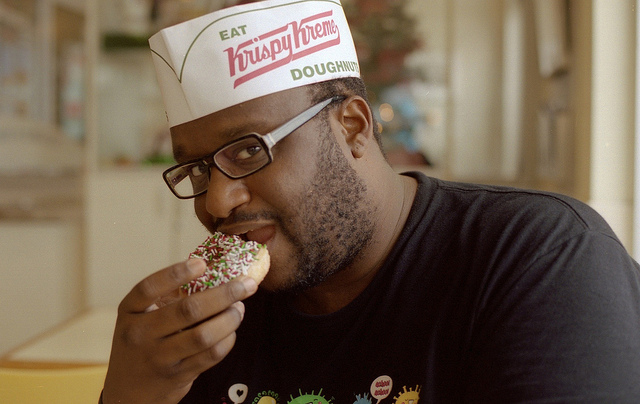

{'doughnut': 'donut', 'man': 'person'}


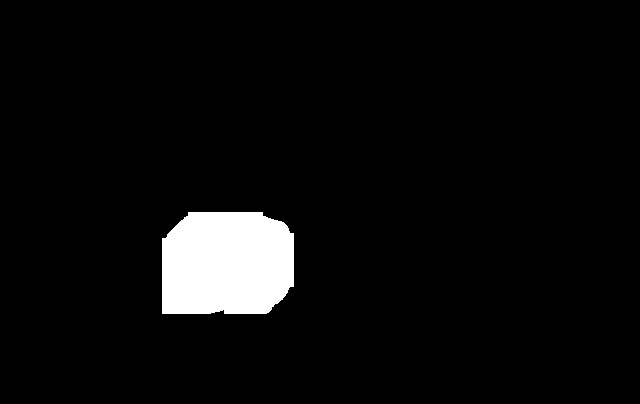

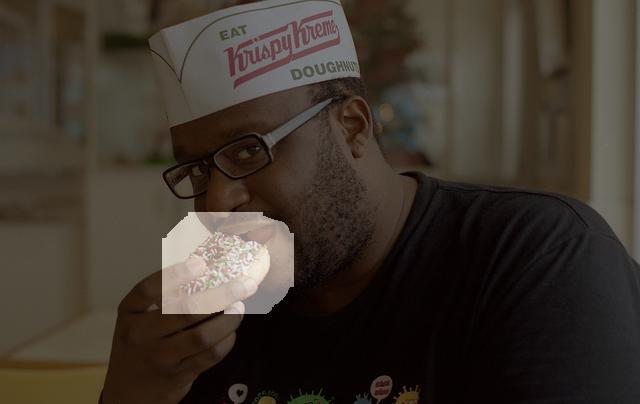

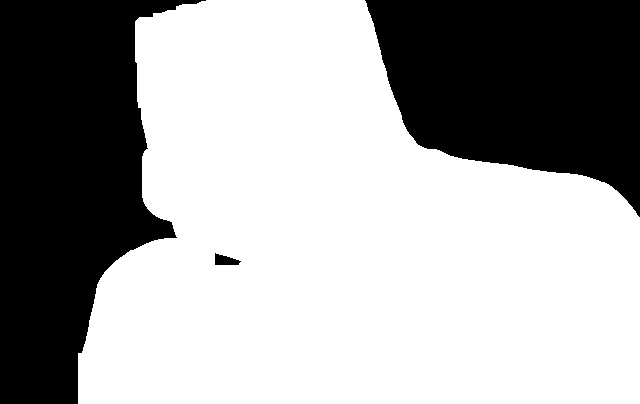

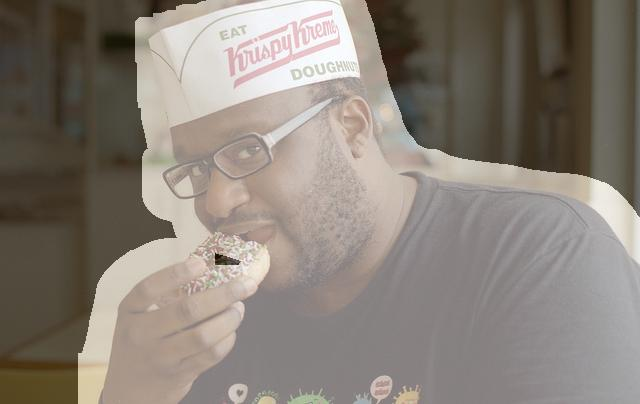

In [ ]:
# 测试:

# 测试:
# 选取一藏随机图片 in this batch
import random
idx = random.randint(0, len(image_caption_pairs)-1)
img_path_test, img_ID_test, caption_test, caption_id_test = image_caption_pairs[idx]
print(idx)
image = Image.open(img_path_test)
display(image)


keyword_class_map = caption_data[idx]
print(keyword_class_map)

for keyword, label in keyword_class_map.items():
    mask_filename = f"{img_ID_test}-{label}.jpg"
    mask_path = os.path.join(maskFolder, mask_filename)
    mask = Image.open(mask_path)
    display(mask)
    blend_path = os.path.join(testMaskBlendFolder, mask_filename)
    blend = Image.open(blend_path)
    display(blend)

# Step 3. Stable Diffusion

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import os
import torch

from diffusers import StableDiffusionInpaintPipeline
#@title stable diffusion
model_id = "runwayml/stable-diffusion-inpainting"

pipe = StableDiffusionInpaintPipeline.from_pretrained(
    "stabilityai/stable-diffusion-2-inpainting",  # 或者其他支持 inpainting 的模型
    torch_dtype=torch.float16,
    safety_checker=None
).to("cuda")

device = "cuda" if torch.cuda.is_available() else "cpu"
pipe = pipe.to(device)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In [ ]:
maskFolder = f"MasksFolder{start}-{start+batch_size-1}"
outputFolder = f"DualImageFolder{start}-{start+batch_size-1}"
os.makedirs(outputFolder, exist_ok=True)

In [ ]:


# Run diffusion based on caption_data and image_caption_pairs (by index)
for i, (img_path, img_id, caption, caption_id) in enumerate(image_caption_pairs):
    label_class_map = caption_data[i]  # e.g. {'person': 'person', 'cake': 'cake'}

    if not os.path.exists(img_path):
        print(f"[{i}] Image not found: {img_path}")
        image = Image.new("RGB", (256, 256), color=(100, 100, 100))  # Placeholder
    else:
        image = Image.open(img_path).convert("RGB")

    # save the size of the image
    width, height = image.size

    for keyword, label in label_class_map.items():
        mask_filename = f"{img_id}-{label}.jpg"
        mask_path = os.path.join(maskFolder, mask_filename)

        if not os.path.exists(mask_path):
            print(f"[{i}] Mask not found: {mask_path}")
            continue

        mask = Image.open(mask_path).convert("RGB")
        prompt = caption
        output_path = os.path.join(outputFolder, mask_filename)

        Prompt = "A clean background, natural surroundings, no people, no object, strictly avoid objects in negative prompt"
        negativePrompt = keyword + ", " + label
        result = pipe(prompt=Prompt, negative_prompt=negativePrompt,image=image, mask_image=mask).images[0]
        result.resize((width, height))
        result.save(output_path)
        print(f"[{i}] Inpainted and saved: {output_path}")

  0%|          | 0/50 [00:00<?, ?it/s]

[0] Inpainted and saved: DualImageFolder30000-30999/341245-train.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[1] Inpainted and saved: DualImageFolder30000-30999/521150-train.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[2] Inpainted and saved: DualImageFolder30000-30999/568955-train.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[3] Inpainted and saved: DualImageFolder30000-30999/393602-train.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[4] Inpainted and saved: DualImageFolder30000-30999/576543-train.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[4] Inpainted and saved: DualImageFolder30000-30999/576543-train.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[9] Inpainted and saved: DualImageFolder30000-30999/127575-traffic light.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[18] Inpainted and saved: DualImageFolder30000-30999/25644-train.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[19] Inpainted and saved: DualImageFolder30000-30999/577685-train.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[20] Inpainted and saved: DualImageFolder30000-30999/316622-train.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[21] Inpainted and saved: DualImageFolder30000-30999/315808-train.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[23] Inpainted and saved: DualImageFolder30000-30999/209261-train.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[24] Inpainted and saved: DualImageFolder30000-30999/190723-train.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[25] Inpainted and saved: DualImageFolder30000-30999/525891-stop sign.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[26] Inpainted and saved: DualImageFolder30000-30999/265209-train.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[27] Inpainted and saved: DualImageFolder30000-30999/321213-train.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[28] Inpainted and saved: DualImageFolder30000-30999/59622-train.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[28] Inpainted and saved: DualImageFolder30000-30999/59622-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[29] Inpainted and saved: DualImageFolder30000-30999/344969-train.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[29] Inpainted and saved: DualImageFolder30000-30999/344969-train.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[29] Inpainted and saved: DualImageFolder30000-30999/344969-train.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[29] Inpainted and saved: DualImageFolder30000-30999/344969-train.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[30] Inpainted and saved: DualImageFolder30000-30999/159683-train.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[32] Inpainted and saved: DualImageFolder30000-30999/451312-train.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[33] Inpainted and saved: DualImageFolder30000-30999/68764-parking meter.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[34] Inpainted and saved: DualImageFolder30000-30999/83815-train.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[35] Inpainted and saved: DualImageFolder30000-30999/53957-train.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[35] Inpainted and saved: DualImageFolder30000-30999/53957-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[36] Inpainted and saved: DualImageFolder30000-30999/157434-train.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[37] Inpainted and saved: DualImageFolder30000-30999/552159-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[38] Inpainted and saved: DualImageFolder30000-30999/173515-truck.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[39] Inpainted and saved: DualImageFolder30000-30999/122343-truck.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[40] Inpainted and saved: DualImageFolder30000-30999/324901-traffic light.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[40] Inpainted and saved: DualImageFolder30000-30999/324901-traffic light.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[40] Inpainted and saved: DualImageFolder30000-30999/324901-truck.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[42] Inpainted and saved: DualImageFolder30000-30999/474653-truck.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[43] Inpainted and saved: DualImageFolder30000-30999/420487-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[44] Inpainted and saved: DualImageFolder30000-30999/62821-truck.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[45] Inpainted and saved: DualImageFolder30000-30999/515186-dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[45] Inpainted and saved: DualImageFolder30000-30999/515186-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[45] Inpainted and saved: DualImageFolder30000-30999/515186-cow.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[47] Inpainted and saved: DualImageFolder30000-30999/469644-cat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[48] Inpainted and saved: DualImageFolder30000-30999/519696-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[50] Inpainted and saved: DualImageFolder30000-30999/289204-truck.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[52] Inpainted and saved: DualImageFolder30000-30999/113812-truck.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[54] Inpainted and saved: DualImageFolder30000-30999/386074-boat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[54] Inpainted and saved: DualImageFolder30000-30999/386074-cow.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[60] Inpainted and saved: DualImageFolder30000-30999/417528-truck.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[63] Inpainted and saved: DualImageFolder30000-30999/553719-cat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[65] Inpainted and saved: DualImageFolder30000-30999/490318-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[66] Inpainted and saved: DualImageFolder30000-30999/43683-cow.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[67] Inpainted and saved: DualImageFolder30000-30999/375185-bed.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[67] Inpainted and saved: DualImageFolder30000-30999/375185-cat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[68] Inpainted and saved: DualImageFolder30000-30999/79733-car.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[69] Inpainted and saved: DualImageFolder30000-30999/460005-bed.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[69] Inpainted and saved: DualImageFolder30000-30999/460005-cat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[70] Inpainted and saved: DualImageFolder30000-30999/164302-bed.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[70] Inpainted and saved: DualImageFolder30000-30999/164302-cat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[71] Inpainted and saved: DualImageFolder30000-30999/197236-cat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[72] Inpainted and saved: DualImageFolder30000-30999/282137-cat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[74] Inpainted and saved: DualImageFolder30000-30999/35322-bicycle.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[74] Inpainted and saved: DualImageFolder30000-30999/35322-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[80] Inpainted and saved: DualImageFolder30000-30999/474764-cat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[81] Inpainted and saved: DualImageFolder30000-30999/429143-boat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[83] Inpainted and saved: DualImageFolder30000-30999/26884-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[84] Inpainted and saved: DualImageFolder30000-30999/51530-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[85] Inpainted and saved: DualImageFolder30000-30999/445774-dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[86] Inpainted and saved: DualImageFolder30000-30999/343167-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[88] Inpainted and saved: DualImageFolder30000-30999/468087-elephant.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[89] Inpainted and saved: DualImageFolder30000-30999/169607-boat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[89] Inpainted and saved: DualImageFolder30000-30999/169607-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[90] Inpainted and saved: DualImageFolder30000-30999/522996-dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[91] Inpainted and saved: DualImageFolder30000-30999/535229-bottle.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[91] Inpainted and saved: DualImageFolder30000-30999/535229-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[91] Inpainted and saved: DualImageFolder30000-30999/535229-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[93] Inpainted and saved: DualImageFolder30000-30999/240762-boat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[93] Inpainted and saved: DualImageFolder30000-30999/240762-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[94] Inpainted and saved: DualImageFolder30000-30999/527342-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[94] Inpainted and saved: DualImageFolder30000-30999/527342-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[94] Inpainted and saved: DualImageFolder30000-30999/527342-chair.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[95] Inpainted and saved: DualImageFolder30000-30999/214174-tie.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[95] Inpainted and saved: DualImageFolder30000-30999/214174-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[97] Inpainted and saved: DualImageFolder30000-30999/545314-tie.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[97] Inpainted and saved: DualImageFolder30000-30999/545314-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[99] Inpainted and saved: DualImageFolder30000-30999/260970-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[100] Inpainted and saved: DualImageFolder30000-30999/530030-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[101] Inpainted and saved: DualImageFolder30000-30999/456528-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[102] Inpainted and saved: DualImageFolder30000-30999/205217-tie.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[102] Inpainted and saved: DualImageFolder30000-30999/205217-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[107] Inpainted and saved: DualImageFolder30000-30999/185667-elephant.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[108] Inpainted and saved: DualImageFolder30000-30999/531961-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[109] Inpainted and saved: DualImageFolder30000-30999/357013-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[110] Inpainted and saved: DualImageFolder30000-30999/458866-boat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[111] Inpainted and saved: DualImageFolder30000-30999/30065-elephant.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[112] Inpainted and saved: DualImageFolder30000-30999/13290-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[113] Inpainted and saved: DualImageFolder30000-30999/81686-dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[115] Inpainted and saved: DualImageFolder30000-30999/106638-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[117] Inpainted and saved: DualImageFolder30000-30999/305954-airplane.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[117] Inpainted and saved: DualImageFolder30000-30999/305954-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[118] Inpainted and saved: DualImageFolder30000-30999/288317-airplane.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[118] Inpainted and saved: DualImageFolder30000-30999/288317-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[119] Inpainted and saved: DualImageFolder30000-30999/572252-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[120] Inpainted and saved: DualImageFolder30000-30999/417619-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[120] Inpainted and saved: DualImageFolder30000-30999/417619-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[123] Inpainted and saved: DualImageFolder30000-30999/345212-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[124] Inpainted and saved: DualImageFolder30000-30999/479120-tie.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[124] Inpainted and saved: DualImageFolder30000-30999/479120-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[125] Inpainted and saved: DualImageFolder30000-30999/460761-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[126] Inpainted and saved: DualImageFolder30000-30999/261521-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[126] Inpainted and saved: DualImageFolder30000-30999/261521-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[127] Inpainted and saved: DualImageFolder30000-30999/356083-elephant.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[128] Inpainted and saved: DualImageFolder30000-30999/505489-umbrella.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[128] Inpainted and saved: DualImageFolder30000-30999/505489-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[130] Inpainted and saved: DualImageFolder30000-30999/285851-umbrella.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[130] Inpainted and saved: DualImageFolder30000-30999/285851-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[131] Inpainted and saved: DualImageFolder30000-30999/529055-umbrella.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[131] Inpainted and saved: DualImageFolder30000-30999/529055-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[132] Inpainted and saved: DualImageFolder30000-30999/565849-tie.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[132] Inpainted and saved: DualImageFolder30000-30999/565849-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[134] Inpainted and saved: DualImageFolder30000-30999/62850-cat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[134] Inpainted and saved: DualImageFolder30000-30999/62850-couch.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[135] Inpainted and saved: DualImageFolder30000-30999/188929-tie.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[135] Inpainted and saved: DualImageFolder30000-30999/188929-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[136] Inpainted and saved: DualImageFolder30000-30999/117935-boat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[136] Inpainted and saved: DualImageFolder30000-30999/117935-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[137] Inpainted and saved: DualImageFolder30000-30999/419110-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[138] Inpainted and saved: DualImageFolder30000-30999/41649-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[138] Inpainted and saved: DualImageFolder30000-30999/41649-elephant.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[139] Inpainted and saved: DualImageFolder30000-30999/393852-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[139] Inpainted and saved: DualImageFolder30000-30999/393852-elephant.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[140] Inpainted and saved: DualImageFolder30000-30999/505145-elephant.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[141] Inpainted and saved: DualImageFolder30000-30999/45084-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[143] Inpainted and saved: DualImageFolder30000-30999/321500-suitcase.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[145] Inpainted and saved: DualImageFolder30000-30999/395899-umbrella.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[145] Inpainted and saved: DualImageFolder30000-30999/395899-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[146] Inpainted and saved: DualImageFolder30000-30999/555857-bed.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[146] Inpainted and saved: DualImageFolder30000-30999/555857-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[147] Inpainted and saved: DualImageFolder30000-30999/550979-giraffe.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[147] Inpainted and saved: DualImageFolder30000-30999/550979-elephant.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[148] Inpainted and saved: DualImageFolder30000-30999/473917-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[152] Inpainted and saved: DualImageFolder30000-30999/233080-umbrella.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[152] Inpainted and saved: DualImageFolder30000-30999/233080-bed.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[152] Inpainted and saved: DualImageFolder30000-30999/233080-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[153] Inpainted and saved: DualImageFolder30000-30999/340993-suitcase.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[153] Inpainted and saved: DualImageFolder30000-30999/340993-chair.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[155] Inpainted and saved: DualImageFolder30000-30999/221311-handbag.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[155] Inpainted and saved: DualImageFolder30000-30999/221311-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[156] Inpainted and saved: DualImageFolder30000-30999/175391-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[156] Inpainted and saved: DualImageFolder30000-30999/175391-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[156] Inpainted and saved: DualImageFolder30000-30999/175391-suitcase.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[158] Inpainted and saved: DualImageFolder30000-30999/283548-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[158] Inpainted and saved: DualImageFolder30000-30999/283548-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[160] Inpainted and saved: DualImageFolder30000-30999/355562-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[160] Inpainted and saved: DualImageFolder30000-30999/355562-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[161] Inpainted and saved: DualImageFolder30000-30999/106025-umbrella.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[161] Inpainted and saved: DualImageFolder30000-30999/106025-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[162] Inpainted and saved: DualImageFolder30000-30999/482733-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[162] Inpainted and saved: DualImageFolder30000-30999/482733-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[166] Inpainted and saved: DualImageFolder30000-30999/56306-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[166] Inpainted and saved: DualImageFolder30000-30999/56306-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[167] Inpainted and saved: DualImageFolder30000-30999/402120-handbag.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[167] Inpainted and saved: DualImageFolder30000-30999/402120-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[168] Inpainted and saved: DualImageFolder30000-30999/110606-bear.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[169] Inpainted and saved: DualImageFolder30000-30999/24894-bear.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[170] Inpainted and saved: DualImageFolder30000-30999/122028-dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[172] Inpainted and saved: DualImageFolder30000-30999/203306-bed.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[172] Inpainted and saved: DualImageFolder30000-30999/203306-dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[172] Inpainted and saved: DualImageFolder30000-30999/203306-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[173] Inpainted and saved: DualImageFolder30000-30999/435377-umbrella.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[173] Inpainted and saved: DualImageFolder30000-30999/435377-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[174] Inpainted and saved: DualImageFolder30000-30999/91960-umbrella.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[174] Inpainted and saved: DualImageFolder30000-30999/91960-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[174] Inpainted and saved: DualImageFolder30000-30999/91960-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[176] Inpainted and saved: DualImageFolder30000-30999/432622-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[180] Inpainted and saved: DualImageFolder30000-30999/529629-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[181] Inpainted and saved: DualImageFolder30000-30999/399752-bear.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[183] Inpainted and saved: DualImageFolder30000-30999/413245-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[183] Inpainted and saved: DualImageFolder30000-30999/413245-dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[185] Inpainted and saved: DualImageFolder30000-30999/113481-bear.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[188] Inpainted and saved: DualImageFolder30000-30999/518951-dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[188] Inpainted and saved: DualImageFolder30000-30999/518951-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[189] Inpainted and saved: DualImageFolder30000-30999/469475-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[189] Inpainted and saved: DualImageFolder30000-30999/469475-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[189] Inpainted and saved: DualImageFolder30000-30999/469475-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[190] Inpainted and saved: DualImageFolder30000-30999/375568-dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[192] Inpainted and saved: DualImageFolder30000-30999/385168-dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[192] Inpainted and saved: DualImageFolder30000-30999/385168-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[192] Inpainted and saved: DualImageFolder30000-30999/385168-couch.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[193] Inpainted and saved: DualImageFolder30000-30999/104099-frisbee.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[193] Inpainted and saved: DualImageFolder30000-30999/104099-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[196] Inpainted and saved: DualImageFolder30000-30999/266963-frisbee.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[196] Inpainted and saved: DualImageFolder30000-30999/266963-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[197] Inpainted and saved: DualImageFolder30000-30999/364154-frisbee.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[197] Inpainted and saved: DualImageFolder30000-30999/364154-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[198] Inpainted and saved: DualImageFolder30000-30999/3528-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[199] Inpainted and saved: DualImageFolder30000-30999/130851-dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[199] Inpainted and saved: DualImageFolder30000-30999/130851-bed.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[200] Inpainted and saved: DualImageFolder30000-30999/208849-car.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[200] Inpainted and saved: DualImageFolder30000-30999/208849-dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[201] Inpainted and saved: DualImageFolder30000-30999/75881-zebra.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[202] Inpainted and saved: DualImageFolder30000-30999/530546-dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[204] Inpainted and saved: DualImageFolder30000-30999/275297-frisbee.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[204] Inpainted and saved: DualImageFolder30000-30999/275297-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[205] Inpainted and saved: DualImageFolder30000-30999/121678-dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[206] Inpainted and saved: DualImageFolder30000-30999/105515-frisbee.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[206] Inpainted and saved: DualImageFolder30000-30999/105515-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[207] Inpainted and saved: DualImageFolder30000-30999/457214-bed.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[207] Inpainted and saved: DualImageFolder30000-30999/457214-dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[208] Inpainted and saved: DualImageFolder30000-30999/145823-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[209] Inpainted and saved: DualImageFolder30000-30999/38525-bed.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[209] Inpainted and saved: DualImageFolder30000-30999/38525-dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[210] Inpainted and saved: DualImageFolder30000-30999/420244-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[211] Inpainted and saved: DualImageFolder30000-30999/96765-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[212] Inpainted and saved: DualImageFolder30000-30999/216160-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[213] Inpainted and saved: DualImageFolder30000-30999/214943-dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[214] Inpainted and saved: DualImageFolder30000-30999/84187-dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[215] Inpainted and saved: DualImageFolder30000-30999/413202-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[216] Inpainted and saved: DualImageFolder30000-30999/167693-zebra.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[217] Inpainted and saved: DualImageFolder30000-30999/210279-zebra.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[218] Inpainted and saved: DualImageFolder30000-30999/213268-zebra.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[219] Inpainted and saved: DualImageFolder30000-30999/561957-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[219] Inpainted and saved: DualImageFolder30000-30999/561957-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[220] Inpainted and saved: DualImageFolder30000-30999/327371-frisbee.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[220] Inpainted and saved: DualImageFolder30000-30999/327371-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[221] Inpainted and saved: DualImageFolder30000-30999/77193-frisbee.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[221] Inpainted and saved: DualImageFolder30000-30999/77193-dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[222] Inpainted and saved: DualImageFolder30000-30999/518730-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[222] Inpainted and saved: DualImageFolder30000-30999/518730-frisbee.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[224] Inpainted and saved: DualImageFolder30000-30999/161996-frisbee.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[224] Inpainted and saved: DualImageFolder30000-30999/161996-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[224] Inpainted and saved: DualImageFolder30000-30999/161996-truck.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[225] Inpainted and saved: DualImageFolder30000-30999/406784-frisbee.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[225] Inpainted and saved: DualImageFolder30000-30999/406784-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[226] Inpainted and saved: DualImageFolder30000-30999/546285-frisbee.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[226] Inpainted and saved: DualImageFolder30000-30999/546285-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[226] Inpainted and saved: DualImageFolder30000-30999/546285-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[227] Inpainted and saved: DualImageFolder30000-30999/159250-zebra.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[229] Inpainted and saved: DualImageFolder30000-30999/559151-zebra.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[230] Inpainted and saved: DualImageFolder30000-30999/558435-zebra.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[230] Inpainted and saved: DualImageFolder30000-30999/558435-zebra.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[231] Inpainted and saved: DualImageFolder30000-30999/310716-zebra.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[232] Inpainted and saved: DualImageFolder30000-30999/510258-zebra.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[233] Inpainted and saved: DualImageFolder30000-30999/184223-zebra.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[235] Inpainted and saved: DualImageFolder30000-30999/328881-zebra.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[236] Inpainted and saved: DualImageFolder30000-30999/527624-horse.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[236] Inpainted and saved: DualImageFolder30000-30999/527624-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[237] Inpainted and saved: DualImageFolder30000-30999/212089-zebra.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[238] Inpainted and saved: DualImageFolder30000-30999/137617-horse.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[238] Inpainted and saved: DualImageFolder30000-30999/137617-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[239] Inpainted and saved: DualImageFolder30000-30999/38786-horse.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[239] Inpainted and saved: DualImageFolder30000-30999/38786-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[240] Inpainted and saved: DualImageFolder30000-30999/479611-horse.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[241] Inpainted and saved: DualImageFolder30000-30999/581795-horse.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[241] Inpainted and saved: DualImageFolder30000-30999/581795-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[242] Inpainted and saved: DualImageFolder30000-30999/368667-horse.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[243] Inpainted and saved: DualImageFolder30000-30999/175739-horse.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[244] Inpainted and saved: DualImageFolder30000-30999/429227-zebra.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[245] Inpainted and saved: DualImageFolder30000-30999/396626-horse.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[246] Inpainted and saved: DualImageFolder30000-30999/43220-zebra.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[247] Inpainted and saved: DualImageFolder30000-30999/512920-zebra.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[248] Inpainted and saved: DualImageFolder30000-30999/501864-horse.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[248] Inpainted and saved: DualImageFolder30000-30999/501864-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[249] Inpainted and saved: DualImageFolder30000-30999/15286-horse.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[249] Inpainted and saved: DualImageFolder30000-30999/15286-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[250] Inpainted and saved: DualImageFolder30000-30999/577265-horse.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[251] Inpainted and saved: DualImageFolder30000-30999/416372-horse.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[252] Inpainted and saved: DualImageFolder30000-30999/377837-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[253] Inpainted and saved: DualImageFolder30000-30999/325387-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[254] Inpainted and saved: DualImageFolder30000-30999/373316-hot dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[255] Inpainted and saved: DualImageFolder30000-30999/219523-orange.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[255] Inpainted and saved: DualImageFolder30000-30999/219523-knife.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[256] Inpainted and saved: DualImageFolder30000-30999/318967-skis.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[256] Inpainted and saved: DualImageFolder30000-30999/318967-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[257] Inpainted and saved: DualImageFolder30000-30999/54586-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[258] Inpainted and saved: DualImageFolder30000-30999/41252-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[258] Inpainted and saved: DualImageFolder30000-30999/41252-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[258] Inpainted and saved: DualImageFolder30000-30999/41252-dining table.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[259] Inpainted and saved: DualImageFolder30000-30999/428019-baseball bat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[259] Inpainted and saved: DualImageFolder30000-30999/428019-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[260] Inpainted and saved: DualImageFolder30000-30999/78827-banana.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[263] Inpainted and saved: DualImageFolder30000-30999/44117-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[264] Inpainted and saved: DualImageFolder30000-30999/530925-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[265] Inpainted and saved: DualImageFolder30000-30999/225925-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[266] Inpainted and saved: DualImageFolder30000-30999/347306-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[267] Inpainted and saved: DualImageFolder30000-30999/346392-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[268] Inpainted and saved: DualImageFolder30000-30999/443964-surfboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[268] Inpainted and saved: DualImageFolder30000-30999/443964-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[269] Inpainted and saved: DualImageFolder30000-30999/462080-orange.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[269] Inpainted and saved: DualImageFolder30000-30999/462080-apple.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[270] Inpainted and saved: DualImageFolder30000-30999/503706-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[270] Inpainted and saved: DualImageFolder30000-30999/503706-sports ball.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[271] Inpainted and saved: DualImageFolder30000-30999/124052-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[272] Inpainted and saved: DualImageFolder30000-30999/426674-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[276] Inpainted and saved: DualImageFolder30000-30999/132527-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[277] Inpainted and saved: DualImageFolder30000-30999/569298-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[278] Inpainted and saved: DualImageFolder30000-30999/210791-baseball bat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[278] Inpainted and saved: DualImageFolder30000-30999/210791-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[280] Inpainted and saved: DualImageFolder30000-30999/479749-pizza.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[280] Inpainted and saved: DualImageFolder30000-30999/479749-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[280] Inpainted and saved: DualImageFolder30000-30999/479749-dining table.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[281] Inpainted and saved: DualImageFolder30000-30999/183448-baseball glove.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[283] Inpainted and saved: DualImageFolder30000-30999/377973-orange.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[284] Inpainted and saved: DualImageFolder30000-30999/26263-banana.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[284] Inpainted and saved: DualImageFolder30000-30999/26263-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[285] Inpainted and saved: DualImageFolder30000-30999/372172-bowl.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[285] Inpainted and saved: DualImageFolder30000-30999/372172-bowl.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[286] Inpainted and saved: DualImageFolder30000-30999/157696-baseball glove.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[286] Inpainted and saved: DualImageFolder30000-30999/157696-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[287] Inpainted and saved: DualImageFolder30000-30999/300908-skis.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[287] Inpainted and saved: DualImageFolder30000-30999/300908-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[288] Inpainted and saved: DualImageFolder30000-30999/352757-skis.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[288] Inpainted and saved: DualImageFolder30000-30999/352757-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[289] Inpainted and saved: DualImageFolder30000-30999/176624-skis.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[289] Inpainted and saved: DualImageFolder30000-30999/176624-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[290] Inpainted and saved: DualImageFolder30000-30999/513643-broccoli.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[292] Inpainted and saved: DualImageFolder30000-30999/511026-banana.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[293] Inpainted and saved: DualImageFolder30000-30999/24828-skis.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[294] Inpainted and saved: DualImageFolder30000-30999/405401-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[297] Inpainted and saved: DualImageFolder30000-30999/342478-banana.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[298] Inpainted and saved: DualImageFolder30000-30999/281900-broccoli.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[302] Inpainted and saved: DualImageFolder30000-30999/237667-broccoli.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[303] Inpainted and saved: DualImageFolder30000-30999/237100-cake.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[304] Inpainted and saved: DualImageFolder30000-30999/369333-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[305] Inpainted and saved: DualImageFolder30000-30999/399618-broccoli.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[306] Inpainted and saved: DualImageFolder30000-30999/506321-broccoli.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[306] Inpainted and saved: DualImageFolder30000-30999/506321-pizza.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[307] Inpainted and saved: DualImageFolder30000-30999/375304-skis.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[307] Inpainted and saved: DualImageFolder30000-30999/375304-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[308] Inpainted and saved: DualImageFolder30000-30999/345987-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[309] Inpainted and saved: DualImageFolder30000-30999/98044-broccoli.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[311] Inpainted and saved: DualImageFolder30000-30999/456149-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[311] Inpainted and saved: DualImageFolder30000-30999/456149-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[313] Inpainted and saved: DualImageFolder30000-30999/558006-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[313] Inpainted and saved: DualImageFolder30000-30999/558006-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[314] Inpainted and saved: DualImageFolder30000-30999/157380-skis.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[314] Inpainted and saved: DualImageFolder30000-30999/157380-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[317] Inpainted and saved: DualImageFolder30000-30999/319977-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[317] Inpainted and saved: DualImageFolder30000-30999/319977-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[318] Inpainted and saved: DualImageFolder30000-30999/11349-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[318] Inpainted and saved: DualImageFolder30000-30999/11349-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[319] Inpainted and saved: DualImageFolder30000-30999/317105-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[319] Inpainted and saved: DualImageFolder30000-30999/317105-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[320] Inpainted and saved: DualImageFolder30000-30999/99363-skis.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[321] Inpainted and saved: DualImageFolder30000-30999/91966-broccoli.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[321] Inpainted and saved: DualImageFolder30000-30999/91966-pizza.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[322] Inpainted and saved: DualImageFolder30000-30999/243564-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[322] Inpainted and saved: DualImageFolder30000-30999/243564-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[323] Inpainted and saved: DualImageFolder30000-30999/177516-bowl.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[324] Inpainted and saved: DualImageFolder30000-30999/521999-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[326] Inpainted and saved: DualImageFolder30000-30999/448131-skis.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[326] Inpainted and saved: DualImageFolder30000-30999/448131-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[328] Inpainted and saved: DualImageFolder30000-30999/498706-skis.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[328] Inpainted and saved: DualImageFolder30000-30999/498706-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[331] Inpainted and saved: DualImageFolder30000-30999/421597-skis.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[331] Inpainted and saved: DualImageFolder30000-30999/421597-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[332] Inpainted and saved: DualImageFolder30000-30999/300264-broccoli.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[335] Inpainted and saved: DualImageFolder30000-30999/302332-skis.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[335] Inpainted and saved: DualImageFolder30000-30999/302332-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[336] Inpainted and saved: DualImageFolder30000-30999/208316-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[336] Inpainted and saved: DualImageFolder30000-30999/208316-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[337] Inpainted and saved: DualImageFolder30000-30999/445915-bottle.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[337] Inpainted and saved: DualImageFolder30000-30999/445915-dining table.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[338] Inpainted and saved: DualImageFolder30000-30999/301604-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[338] Inpainted and saved: DualImageFolder30000-30999/301604-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[339] Inpainted and saved: DualImageFolder30000-30999/1837-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[339] Inpainted and saved: DualImageFolder30000-30999/1837-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[340] Inpainted and saved: DualImageFolder30000-30999/146215-wine glass.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[340] Inpainted and saved: DualImageFolder30000-30999/146215-dining table.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[344] Inpainted and saved: DualImageFolder30000-30999/237247-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[344] Inpainted and saved: DualImageFolder30000-30999/237247-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[345] Inpainted and saved: DualImageFolder30000-30999/242081-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[345] Inpainted and saved: DualImageFolder30000-30999/242081-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[346] Inpainted and saved: DualImageFolder30000-30999/44671-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[346] Inpainted and saved: DualImageFolder30000-30999/44671-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[347] Inpainted and saved: DualImageFolder30000-30999/213274-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[347] Inpainted and saved: DualImageFolder30000-30999/213274-dining table.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[350] Inpainted and saved: DualImageFolder30000-30999/285138-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[350] Inpainted and saved: DualImageFolder30000-30999/285138-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[351] Inpainted and saved: DualImageFolder30000-30999/139831-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[352] Inpainted and saved: DualImageFolder30000-30999/113309-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[353] Inpainted and saved: DualImageFolder30000-30999/330124-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[355] Inpainted and saved: DualImageFolder30000-30999/145444-tv.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[356] Inpainted and saved: DualImageFolder30000-30999/333049-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[356] Inpainted and saved: DualImageFolder30000-30999/333049-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[357] Inpainted and saved: DualImageFolder30000-30999/85579-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[358] Inpainted and saved: DualImageFolder30000-30999/263446-bowl.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[358] Inpainted and saved: DualImageFolder30000-30999/263446-bowl.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[359] Inpainted and saved: DualImageFolder30000-30999/568068-skis.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[359] Inpainted and saved: DualImageFolder30000-30999/568068-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[361] Inpainted and saved: DualImageFolder30000-30999/132495-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[362] Inpainted and saved: DualImageFolder30000-30999/182164-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[362] Inpainted and saved: DualImageFolder30000-30999/182164-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[364] Inpainted and saved: DualImageFolder30000-30999/365164-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[364] Inpainted and saved: DualImageFolder30000-30999/365164-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[368] Inpainted and saved: DualImageFolder30000-30999/295670-skis.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[368] Inpainted and saved: DualImageFolder30000-30999/295670-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[369] Inpainted and saved: DualImageFolder30000-30999/419752-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[369] Inpainted and saved: DualImageFolder30000-30999/419752-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[370] Inpainted and saved: DualImageFolder30000-30999/318768-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[370] Inpainted and saved: DualImageFolder30000-30999/318768-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[371] Inpainted and saved: DualImageFolder30000-30999/96877-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[372] Inpainted and saved: DualImageFolder30000-30999/169287-skis.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[372] Inpainted and saved: DualImageFolder30000-30999/169287-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[373] Inpainted and saved: DualImageFolder30000-30999/347655-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[374] Inpainted and saved: DualImageFolder30000-30999/158299-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[374] Inpainted and saved: DualImageFolder30000-30999/158299-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[375] Inpainted and saved: DualImageFolder30000-30999/347926-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[375] Inpainted and saved: DualImageFolder30000-30999/347926-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[376] Inpainted and saved: DualImageFolder30000-30999/181612-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[377] Inpainted and saved: DualImageFolder30000-30999/248467-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[378] Inpainted and saved: DualImageFolder30000-30999/418489-skis.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[378] Inpainted and saved: DualImageFolder30000-30999/418489-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[379] Inpainted and saved: DualImageFolder30000-30999/176826-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[380] Inpainted and saved: DualImageFolder30000-30999/314645-snowboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[380] Inpainted and saved: DualImageFolder30000-30999/314645-snowboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[381] Inpainted and saved: DualImageFolder30000-30999/139380-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[382] Inpainted and saved: DualImageFolder30000-30999/539606-skis.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[382] Inpainted and saved: DualImageFolder30000-30999/539606-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[383] Inpainted and saved: DualImageFolder30000-30999/9836-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[385] Inpainted and saved: DualImageFolder30000-30999/197739-hot dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[385] Inpainted and saved: DualImageFolder30000-30999/197739-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[386] Inpainted and saved: DualImageFolder30000-30999/497440-hot dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[387] Inpainted and saved: DualImageFolder30000-30999/142380-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[387] Inpainted and saved: DualImageFolder30000-30999/142380-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[388] Inpainted and saved: DualImageFolder30000-30999/85777-hot dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[389] Inpainted and saved: DualImageFolder30000-30999/278983-sandwich.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[389] Inpainted and saved: DualImageFolder30000-30999/278983-hot dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[390] Inpainted and saved: DualImageFolder30000-30999/138789-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[391] Inpainted and saved: DualImageFolder30000-30999/364559-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[392] Inpainted and saved: DualImageFolder30000-30999/414989-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[392] Inpainted and saved: DualImageFolder30000-30999/414989-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[394] Inpainted and saved: DualImageFolder30000-30999/41340-skis.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[394] Inpainted and saved: DualImageFolder30000-30999/41340-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[395] Inpainted and saved: DualImageFolder30000-30999/99788-hot dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[396] Inpainted and saved: DualImageFolder30000-30999/493417-hot dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[396] Inpainted and saved: DualImageFolder30000-30999/493417-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[398] Inpainted and saved: DualImageFolder30000-30999/463474-skateboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[401] Inpainted and saved: DualImageFolder30000-30999/206623-hot dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[402] Inpainted and saved: DualImageFolder30000-30999/200843-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[402] Inpainted and saved: DualImageFolder30000-30999/200843-snowboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[403] Inpainted and saved: DualImageFolder30000-30999/18775-snowboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[404] Inpainted and saved: DualImageFolder30000-30999/156152-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[404] Inpainted and saved: DualImageFolder30000-30999/156152-snowboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[405] Inpainted and saved: DualImageFolder30000-30999/250877-skis.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[406] Inpainted and saved: DualImageFolder30000-30999/510061-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[406] Inpainted and saved: DualImageFolder30000-30999/510061-snowboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[407] Inpainted and saved: DualImageFolder30000-30999/229362-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[407] Inpainted and saved: DualImageFolder30000-30999/229362-dining table.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[408] Inpainted and saved: DualImageFolder30000-30999/171444-hot dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[409] Inpainted and saved: DualImageFolder30000-30999/185225-hot dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[409] Inpainted and saved: DualImageFolder30000-30999/185225-bowl.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[414] Inpainted and saved: DualImageFolder30000-30999/560472-hot dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[414] Inpainted and saved: DualImageFolder30000-30999/560472-dining table.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[415] Inpainted and saved: DualImageFolder30000-30999/84383-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[416] Inpainted and saved: DualImageFolder30000-30999/519832-donut.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[417] Inpainted and saved: DualImageFolder30000-30999/384362-donut.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[422] Inpainted and saved: DualImageFolder30000-30999/92627-baseball bat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[422] Inpainted and saved: DualImageFolder30000-30999/92627-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[423] Inpainted and saved: DualImageFolder30000-30999/465530-teddy bear.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[424] Inpainted and saved: DualImageFolder30000-30999/2892-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[425] Inpainted and saved: DualImageFolder30000-30999/101503-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[426] Inpainted and saved: DualImageFolder30000-30999/461505-dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[426] Inpainted and saved: DualImageFolder30000-30999/461505-sports ball.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[429] Inpainted and saved: DualImageFolder30000-30999/212757-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[429] Inpainted and saved: DualImageFolder30000-30999/212757-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[430] Inpainted and saved: DualImageFolder30000-30999/349870-donut.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[430] Inpainted and saved: DualImageFolder30000-30999/349870-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[431] Inpainted and saved: DualImageFolder30000-30999/51522-donut.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[432] Inpainted and saved: DualImageFolder30000-30999/306798-donut.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[432] Inpainted and saved: DualImageFolder30000-30999/306798-cup.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[432] Inpainted and saved: DualImageFolder30000-30999/306798-dining table.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[433] Inpainted and saved: DualImageFolder30000-30999/434370-train.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[433] Inpainted and saved: DualImageFolder30000-30999/434370-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[433] Inpainted and saved: DualImageFolder30000-30999/434370-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[434] Inpainted and saved: DualImageFolder30000-30999/410061-donut.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[435] Inpainted and saved: DualImageFolder30000-30999/139728-sandwich.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[437] Inpainted and saved: DualImageFolder30000-30999/161333-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[439] Inpainted and saved: DualImageFolder30000-30999/42166-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[442] Inpainted and saved: DualImageFolder30000-30999/411646-surfboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[442] Inpainted and saved: DualImageFolder30000-30999/411646-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[444] Inpainted and saved: DualImageFolder30000-30999/397217-cake.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[444] Inpainted and saved: DualImageFolder30000-30999/397217-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[444] Inpainted and saved: DualImageFolder30000-30999/397217-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[445] Inpainted and saved: DualImageFolder30000-30999/16465-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[445] Inpainted and saved: DualImageFolder30000-30999/16465-sports ball.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[445] Inpainted and saved: DualImageFolder30000-30999/16465-sports ball.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[446] Inpainted and saved: DualImageFolder30000-30999/372943-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[446] Inpainted and saved: DualImageFolder30000-30999/372943-sports ball.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[447] Inpainted and saved: DualImageFolder30000-30999/545507-bed.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[447] Inpainted and saved: DualImageFolder30000-30999/545507-tv.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[448] Inpainted and saved: DualImageFolder30000-30999/356749-bed.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[448] Inpainted and saved: DualImageFolder30000-30999/356749-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[449] Inpainted and saved: DualImageFolder30000-30999/282380-surfboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[449] Inpainted and saved: DualImageFolder30000-30999/282380-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[450] Inpainted and saved: DualImageFolder30000-30999/348857-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[450] Inpainted and saved: DualImageFolder30000-30999/348857-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[450] Inpainted and saved: DualImageFolder30000-30999/348857-dining table.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[451] Inpainted and saved: DualImageFolder30000-30999/54452-surfboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[451] Inpainted and saved: DualImageFolder30000-30999/54452-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[452] Inpainted and saved: DualImageFolder30000-30999/7733-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[452] Inpainted and saved: DualImageFolder30000-30999/7733-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[453] Inpainted and saved: DualImageFolder30000-30999/104884-bed.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[453] Inpainted and saved: DualImageFolder30000-30999/104884-bed.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[453] Inpainted and saved: DualImageFolder30000-30999/104884-bed.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[454] Inpainted and saved: DualImageFolder30000-30999/82220-cake.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[454] Inpainted and saved: DualImageFolder30000-30999/82220-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[454] Inpainted and saved: DualImageFolder30000-30999/82220-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[454] Inpainted and saved: DualImageFolder30000-30999/82220-dining table.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[456] Inpainted and saved: DualImageFolder30000-30999/575284-surfboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[456] Inpainted and saved: DualImageFolder30000-30999/575284-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[458] Inpainted and saved: DualImageFolder30000-30999/75999-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[459] Inpainted and saved: DualImageFolder30000-30999/94975-bed.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[459] Inpainted and saved: DualImageFolder30000-30999/94975-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[460] Inpainted and saved: DualImageFolder30000-30999/122896-surfboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[460] Inpainted and saved: DualImageFolder30000-30999/122896-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[461] Inpainted and saved: DualImageFolder30000-30999/102184-surfboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[461] Inpainted and saved: DualImageFolder30000-30999/102184-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[462] Inpainted and saved: DualImageFolder30000-30999/396021-cake.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[462] Inpainted and saved: DualImageFolder30000-30999/396021-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[462] Inpainted and saved: DualImageFolder30000-30999/396021-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[464] Inpainted and saved: DualImageFolder30000-30999/69214-bed.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[464] Inpainted and saved: DualImageFolder30000-30999/69214-dining table.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[464] Inpainted and saved: DualImageFolder30000-30999/69214-chair.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[465] Inpainted and saved: DualImageFolder30000-30999/387772-bed.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[465] Inpainted and saved: DualImageFolder30000-30999/387772-cat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[466] Inpainted and saved: DualImageFolder30000-30999/22518-cake.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[467] Inpainted and saved: DualImageFolder30000-30999/377964-surfboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[467] Inpainted and saved: DualImageFolder30000-30999/377964-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[468] Inpainted and saved: DualImageFolder30000-30999/158223-bottle.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[468] Inpainted and saved: DualImageFolder30000-30999/158223-cake.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[468] Inpainted and saved: DualImageFolder30000-30999/158223-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[469] Inpainted and saved: DualImageFolder30000-30999/123312-cake.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[469] Inpainted and saved: DualImageFolder30000-30999/123312-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[469] Inpainted and saved: DualImageFolder30000-30999/123312-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[470] Inpainted and saved: DualImageFolder30000-30999/557355-cake.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[470] Inpainted and saved: DualImageFolder30000-30999/557355-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[471] Inpainted and saved: DualImageFolder30000-30999/2536-surfboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[471] Inpainted and saved: DualImageFolder30000-30999/2536-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[472] Inpainted and saved: DualImageFolder30000-30999/54606-pizza.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[473] Inpainted and saved: DualImageFolder30000-30999/201394-pizza.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[475] Inpainted and saved: DualImageFolder30000-30999/456322-surfboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[475] Inpainted and saved: DualImageFolder30000-30999/456322-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[476] Inpainted and saved: DualImageFolder30000-30999/508398-chair.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[477] Inpainted and saved: DualImageFolder30000-30999/183427-pizza.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[477] Inpainted and saved: DualImageFolder30000-30999/183427-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[477] Inpainted and saved: DualImageFolder30000-30999/183427-bottle.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[477] Inpainted and saved: DualImageFolder30000-30999/183427-dining table.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[479] Inpainted and saved: DualImageFolder30000-30999/118471-pizza.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[481] Inpainted and saved: DualImageFolder30000-30999/547769-pizza.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[482] Inpainted and saved: DualImageFolder30000-30999/80430-tennis racket.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[482] Inpainted and saved: DualImageFolder30000-30999/80430-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[482] Inpainted and saved: DualImageFolder30000-30999/80430-sports ball.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[483] Inpainted and saved: DualImageFolder30000-30999/269022-sports ball.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[484] Inpainted and saved: DualImageFolder30000-30999/377543-tennis racket.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[484] Inpainted and saved: DualImageFolder30000-30999/377543-sports ball.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[486] Inpainted and saved: DualImageFolder30000-30999/426558-chair.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[486] Inpainted and saved: DualImageFolder30000-30999/426558-couch.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[487] Inpainted and saved: DualImageFolder30000-30999/8297-tennis racket.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[487] Inpainted and saved: DualImageFolder30000-30999/8297-sports ball.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[487] Inpainted and saved: DualImageFolder30000-30999/8297-sports ball.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[488] Inpainted and saved: DualImageFolder30000-30999/341429-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[492] Inpainted and saved: DualImageFolder30000-30999/72817-pizza.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[492] Inpainted and saved: DualImageFolder30000-30999/72817-bowl.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[492] Inpainted and saved: DualImageFolder30000-30999/72817-bowl.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[493] Inpainted and saved: DualImageFolder30000-30999/220948-pizza.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[494] Inpainted and saved: DualImageFolder30000-30999/482913-pizza.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[494] Inpainted and saved: DualImageFolder30000-30999/482913-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[501] Inpainted and saved: DualImageFolder30000-30999/376241-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[501] Inpainted and saved: DualImageFolder30000-30999/376241-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[503] Inpainted and saved: DualImageFolder30000-30999/541147-couch.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[504] Inpainted and saved: DualImageFolder30000-30999/20794-potted plant.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[504] Inpainted and saved: DualImageFolder30000-30999/20794-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[505] Inpainted and saved: DualImageFolder30000-30999/579186-couch.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[506] Inpainted and saved: DualImageFolder30000-30999/409457-couch.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[507] Inpainted and saved: DualImageFolder30000-30999/197718-tv.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[507] Inpainted and saved: DualImageFolder30000-30999/197718-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[508] Inpainted and saved: DualImageFolder30000-30999/147278-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[509] Inpainted and saved: DualImageFolder30000-30999/480412-remote.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[509] Inpainted and saved: DualImageFolder30000-30999/480412-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[509] Inpainted and saved: DualImageFolder30000-30999/480412-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[509] Inpainted and saved: DualImageFolder30000-30999/480412-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[510] Inpainted and saved: DualImageFolder30000-30999/529126-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[511] Inpainted and saved: DualImageFolder30000-30999/414588-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[512] Inpainted and saved: DualImageFolder30000-30999/182571-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[514] Inpainted and saved: DualImageFolder30000-30999/168368-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[514] Inpainted and saved: DualImageFolder30000-30999/168368-couch.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[515] Inpainted and saved: DualImageFolder30000-30999/439988-chair.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[515] Inpainted and saved: DualImageFolder30000-30999/439988-couch.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[516] Inpainted and saved: DualImageFolder30000-30999/320077-tv.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[516] Inpainted and saved: DualImageFolder30000-30999/320077-couch.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[517] Inpainted and saved: DualImageFolder30000-30999/123878-chair.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[517] Inpainted and saved: DualImageFolder30000-30999/123878-couch.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[517] Inpainted and saved: DualImageFolder30000-30999/123878-couch.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[519] Inpainted and saved: DualImageFolder30000-30999/344932-chair.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[519] Inpainted and saved: DualImageFolder30000-30999/344932-couch.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[522] Inpainted and saved: DualImageFolder30000-30999/446506-chair.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[525] Inpainted and saved: DualImageFolder30000-30999/426149-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[529] Inpainted and saved: DualImageFolder30000-30999/195195-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[532] Inpainted and saved: DualImageFolder30000-30999/161865-remote.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[532] Inpainted and saved: DualImageFolder30000-30999/161865-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[533] Inpainted and saved: DualImageFolder30000-30999/528550-couch.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[534] Inpainted and saved: DualImageFolder30000-30999/18571-keyboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[535] Inpainted and saved: DualImageFolder30000-30999/151170-keyboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[535] Inpainted and saved: DualImageFolder30000-30999/151170-mouse.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[536] Inpainted and saved: DualImageFolder30000-30999/506360-chair.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[536] Inpainted and saved: DualImageFolder30000-30999/506360-couch.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[536] Inpainted and saved: DualImageFolder30000-30999/506360-couch.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[538] Inpainted and saved: DualImageFolder30000-30999/549201-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[539] Inpainted and saved: DualImageFolder30000-30999/124709-keyboard.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[539] Inpainted and saved: DualImageFolder30000-30999/124709-tv.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[542] Inpainted and saved: DualImageFolder30000-30999/176192-bed.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[543] Inpainted and saved: DualImageFolder30000-30999/184673-train.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[543] Inpainted and saved: DualImageFolder30000-30999/184673-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[544] Inpainted and saved: DualImageFolder30000-30999/532998-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[545] Inpainted and saved: DualImageFolder30000-30999/556636-bench.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[545] Inpainted and saved: DualImageFolder30000-30999/556636-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[547] Inpainted and saved: DualImageFolder30000-30999/422044-tv.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[548] Inpainted and saved: DualImageFolder30000-30999/223006-dining table.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[548] Inpainted and saved: DualImageFolder30000-30999/223006-couch.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[549] Inpainted and saved: DualImageFolder30000-30999/39888-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[550] Inpainted and saved: DualImageFolder30000-30999/448343-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[552] Inpainted and saved: DualImageFolder30000-30999/360485-chair.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[552] Inpainted and saved: DualImageFolder30000-30999/360485-couch.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[554] Inpainted and saved: DualImageFolder30000-30999/532852-clock.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[557] Inpainted and saved: DualImageFolder30000-30999/438858-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[557] Inpainted and saved: DualImageFolder30000-30999/438858-kite.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[558] Inpainted and saved: DualImageFolder30000-30999/413367-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[558] Inpainted and saved: DualImageFolder30000-30999/413367-kite.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[559] Inpainted and saved: DualImageFolder30000-30999/251375-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[559] Inpainted and saved: DualImageFolder30000-30999/251375-kite.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[560] Inpainted and saved: DualImageFolder30000-30999/337068-dining table.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[560] Inpainted and saved: DualImageFolder30000-30999/337068-chair.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[561] Inpainted and saved: DualImageFolder30000-30999/519844-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[561] Inpainted and saved: DualImageFolder30000-30999/519844-kite.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[562] Inpainted and saved: DualImageFolder30000-30999/262951-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[562] Inpainted and saved: DualImageFolder30000-30999/262951-kite.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[563] Inpainted and saved: DualImageFolder30000-30999/215300-kite.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[564] Inpainted and saved: DualImageFolder30000-30999/209195-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[564] Inpainted and saved: DualImageFolder30000-30999/209195-kite.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[566] Inpainted and saved: DualImageFolder30000-30999/479698-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[566] Inpainted and saved: DualImageFolder30000-30999/479698-kite.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[567] Inpainted and saved: DualImageFolder30000-30999/324663-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[569] Inpainted and saved: DualImageFolder30000-30999/430654-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[569] Inpainted and saved: DualImageFolder30000-30999/430654-kite.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[571] Inpainted and saved: DualImageFolder30000-30999/403683-kite.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[574] Inpainted and saved: DualImageFolder30000-30999/579713-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[574] Inpainted and saved: DualImageFolder30000-30999/579713-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[574] Inpainted and saved: DualImageFolder30000-30999/579713-kite.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[577] Inpainted and saved: DualImageFolder30000-30999/561713-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[577] Inpainted and saved: DualImageFolder30000-30999/561713-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[579] Inpainted and saved: DualImageFolder30000-30999/474424-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[579] Inpainted and saved: DualImageFolder30000-30999/474424-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[582] Inpainted and saved: DualImageFolder30000-30999/205916-clock.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[583] Inpainted and saved: DualImageFolder30000-30999/61560-baseball bat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[583] Inpainted and saved: DualImageFolder30000-30999/61560-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[584] Inpainted and saved: DualImageFolder30000-30999/309413-baseball bat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[585] Inpainted and saved: DualImageFolder30000-30999/546130-baseball bat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[585] Inpainted and saved: DualImageFolder30000-30999/546130-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[585] Inpainted and saved: DualImageFolder30000-30999/546130-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[585] Inpainted and saved: DualImageFolder30000-30999/546130-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[587] Inpainted and saved: DualImageFolder30000-30999/118848-baseball bat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[588] Inpainted and saved: DualImageFolder30000-30999/210848-baseball bat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[588] Inpainted and saved: DualImageFolder30000-30999/210848-baseball bat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[588] Inpainted and saved: DualImageFolder30000-30999/210848-sports ball.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[589] Inpainted and saved: DualImageFolder30000-30999/486839-baseball bat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[589] Inpainted and saved: DualImageFolder30000-30999/486839-baseball bat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[589] Inpainted and saved: DualImageFolder30000-30999/486839-baseball glove.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[590] Inpainted and saved: DualImageFolder30000-30999/404917-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[591] Inpainted and saved: DualImageFolder30000-30999/120329-baseball bat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[592] Inpainted and saved: DualImageFolder30000-30999/39082-tennis racket.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[592] Inpainted and saved: DualImageFolder30000-30999/39082-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[592] Inpainted and saved: DualImageFolder30000-30999/39082-sports ball.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[593] Inpainted and saved: DualImageFolder30000-30999/101215-tennis racket.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[593] Inpainted and saved: DualImageFolder30000-30999/101215-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[596] Inpainted and saved: DualImageFolder30000-30999/240243-tennis racket.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[596] Inpainted and saved: DualImageFolder30000-30999/240243-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[596] Inpainted and saved: DualImageFolder30000-30999/240243-sports ball.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[597] Inpainted and saved: DualImageFolder30000-30999/569223-pizza.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[598] Inpainted and saved: DualImageFolder30000-30999/356153-pizza.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[599] Inpainted and saved: DualImageFolder30000-30999/129568-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[599] Inpainted and saved: DualImageFolder30000-30999/129568-sports ball.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[599] Inpainted and saved: DualImageFolder30000-30999/129568-sports ball.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[600] Inpainted and saved: DualImageFolder30000-30999/217297-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[601] Inpainted and saved: DualImageFolder30000-30999/4716-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[602] Inpainted and saved: DualImageFolder30000-30999/536950-tennis racket.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[602] Inpainted and saved: DualImageFolder30000-30999/536950-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[603] Inpainted and saved: DualImageFolder30000-30999/467384-tennis racket.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[604] Inpainted and saved: DualImageFolder30000-30999/444953-tennis racket.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[604] Inpainted and saved: DualImageFolder30000-30999/444953-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[607] Inpainted and saved: DualImageFolder30000-30999/537367-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[608] Inpainted and saved: DualImageFolder30000-30999/110094-tennis racket.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[608] Inpainted and saved: DualImageFolder30000-30999/110094-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[609] Inpainted and saved: DualImageFolder30000-30999/10265-sports ball.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[611] Inpainted and saved: DualImageFolder30000-30999/388871-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[612] Inpainted and saved: DualImageFolder30000-30999/109125-pizza.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[612] Inpainted and saved: DualImageFolder30000-30999/109125-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[613] Inpainted and saved: DualImageFolder30000-30999/178678-tennis racket.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[613] Inpainted and saved: DualImageFolder30000-30999/178678-tennis racket.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[613] Inpainted and saved: DualImageFolder30000-30999/178678-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[614] Inpainted and saved: DualImageFolder30000-30999/540321-laptop.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[614] Inpainted and saved: DualImageFolder30000-30999/540321-couch.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[616] Inpainted and saved: DualImageFolder30000-30999/447738-vase.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[618] Inpainted and saved: DualImageFolder30000-30999/422427-cell phone.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[618] Inpainted and saved: DualImageFolder30000-30999/422427-laptop.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[619] Inpainted and saved: DualImageFolder30000-30999/541029-dining table.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[619] Inpainted and saved: DualImageFolder30000-30999/541029-laptop.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[621] Inpainted and saved: DualImageFolder30000-30999/62715-clock.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[622] Inpainted and saved: DualImageFolder30000-30999/80738-vase.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[623] Inpainted and saved: DualImageFolder30000-30999/571797-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[623] Inpainted and saved: DualImageFolder30000-30999/571797-laptop.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[626] Inpainted and saved: DualImageFolder30000-30999/488066-teddy bear.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[626] Inpainted and saved: DualImageFolder30000-30999/488066-chair.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[627] Inpainted and saved: DualImageFolder30000-30999/59692-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[628] Inpainted and saved: DualImageFolder30000-30999/126674-teddy bear.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[629] Inpainted and saved: DualImageFolder30000-30999/547764-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[630] Inpainted and saved: DualImageFolder30000-30999/297091-teddy bear.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[630] Inpainted and saved: DualImageFolder30000-30999/297091-book.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[630] Inpainted and saved: DualImageFolder30000-30999/297091-chair.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[631] Inpainted and saved: DualImageFolder30000-30999/463496-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[631] Inpainted and saved: DualImageFolder30000-30999/463496-laptop.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[632] Inpainted and saved: DualImageFolder30000-30999/64593-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[633] Inpainted and saved: DualImageFolder30000-30999/461530-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[633] Inpainted and saved: DualImageFolder30000-30999/461530-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[633] Inpainted and saved: DualImageFolder30000-30999/461530-bowl.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[634] Inpainted and saved: DualImageFolder30000-30999/146760-potted plant.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[639] Inpainted and saved: DualImageFolder30000-30999/187213-sink.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[639] Inpainted and saved: DualImageFolder30000-30999/187213-vase.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[640] Inpainted and saved: DualImageFolder30000-30999/114226-cup.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[640] Inpainted and saved: DualImageFolder30000-30999/114226-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[640] Inpainted and saved: DualImageFolder30000-30999/114226-laptop.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[642] Inpainted and saved: DualImageFolder30000-30999/181343-cell phone.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[642] Inpainted and saved: DualImageFolder30000-30999/181343-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[642] Inpainted and saved: DualImageFolder30000-30999/181343-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[643] Inpainted and saved: DualImageFolder30000-30999/287519-cell phone.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[643] Inpainted and saved: DualImageFolder30000-30999/287519-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[645] Inpainted and saved: DualImageFolder30000-30999/341226-cell phone.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[645] Inpainted and saved: DualImageFolder30000-30999/341226-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[646] Inpainted and saved: DualImageFolder30000-30999/304319-book.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[646] Inpainted and saved: DualImageFolder30000-30999/304319-book.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[647] Inpainted and saved: DualImageFolder30000-30999/134351-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[648] Inpainted and saved: DualImageFolder30000-30999/196016-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[651] Inpainted and saved: DualImageFolder30000-30999/56519-cell phone.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[651] Inpainted and saved: DualImageFolder30000-30999/56519-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[651] Inpainted and saved: DualImageFolder30000-30999/56519-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[652] Inpainted and saved: DualImageFolder30000-30999/55689-cell phone.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[652] Inpainted and saved: DualImageFolder30000-30999/55689-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[653] Inpainted and saved: DualImageFolder30000-30999/105330-cell phone.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[654] Inpainted and saved: DualImageFolder30000-30999/225508-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[654] Inpainted and saved: DualImageFolder30000-30999/225508-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[655] Inpainted and saved: DualImageFolder30000-30999/451142-laptop.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[657] Inpainted and saved: DualImageFolder30000-30999/332158-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[658] Inpainted and saved: DualImageFolder30000-30999/47904-cell phone.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[658] Inpainted and saved: DualImageFolder30000-30999/47904-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[662] Inpainted and saved: DualImageFolder30000-30999/527907-potted plant.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[662] Inpainted and saved: DualImageFolder30000-30999/527907-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[664] Inpainted and saved: DualImageFolder30000-30999/278115-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[665] Inpainted and saved: DualImageFolder30000-30999/538517-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[666] Inpainted and saved: DualImageFolder30000-30999/414463-cell phone.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[666] Inpainted and saved: DualImageFolder30000-30999/414463-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[667] Inpainted and saved: DualImageFolder30000-30999/246166-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[669] Inpainted and saved: DualImageFolder30000-30999/473709-oven.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[673] Inpainted and saved: DualImageFolder30000-30999/281745-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[674] Inpainted and saved: DualImageFolder30000-30999/449350-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[675] Inpainted and saved: DualImageFolder30000-30999/510977-bottle.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[675] Inpainted and saved: DualImageFolder30000-30999/510977-refrigerator.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[675] Inpainted and saved: DualImageFolder30000-30999/510977-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[680] Inpainted and saved: DualImageFolder30000-30999/105293-bowl.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[680] Inpainted and saved: DualImageFolder30000-30999/105293-bowl.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[681] Inpainted and saved: DualImageFolder30000-30999/49554-clock.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[683] Inpainted and saved: DualImageFolder30000-30999/502911-donut.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[688] Inpainted and saved: DualImageFolder30000-30999/381922-teddy bear.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[689] Inpainted and saved: DualImageFolder30000-30999/553640-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[690] Inpainted and saved: DualImageFolder30000-30999/229654-clock.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[691] Inpainted and saved: DualImageFolder30000-30999/25377-vase.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[695] Inpainted and saved: DualImageFolder30000-30999/367372-chair.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[697] Inpainted and saved: DualImageFolder30000-30999/242597-vase.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[700] Inpainted and saved: DualImageFolder30000-30999/321610-scissors.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[701] Inpainted and saved: DualImageFolder30000-30999/552112-bird.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[706] Inpainted and saved: DualImageFolder30000-30999/494618-sandwich.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[706] Inpainted and saved: DualImageFolder30000-30999/494618-bottle.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[708] Inpainted and saved: DualImageFolder30000-30999/426246-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[708] Inpainted and saved: DualImageFolder30000-30999/426246-dining table.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[709] Inpainted and saved: DualImageFolder30000-30999/475664-bottle.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[709] Inpainted and saved: DualImageFolder30000-30999/475664-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[710] Inpainted and saved: DualImageFolder30000-30999/354794-wine glass.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[710] Inpainted and saved: DualImageFolder30000-30999/354794-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[710] Inpainted and saved: DualImageFolder30000-30999/354794-dining table.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[711] Inpainted and saved: DualImageFolder30000-30999/257575-bottle.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[711] Inpainted and saved: DualImageFolder30000-30999/257575-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[711] Inpainted and saved: DualImageFolder30000-30999/257575-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[712] Inpainted and saved: DualImageFolder30000-30999/289255-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[713] Inpainted and saved: DualImageFolder30000-30999/387333-wine glass.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[713] Inpainted and saved: DualImageFolder30000-30999/387333-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[713] Inpainted and saved: DualImageFolder30000-30999/387333-dining table.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[714] Inpainted and saved: DualImageFolder30000-30999/522062-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[714] Inpainted and saved: DualImageFolder30000-30999/522062-wine glass.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[715] Inpainted and saved: DualImageFolder30000-30999/300806-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[715] Inpainted and saved: DualImageFolder30000-30999/300806-wine glass.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[716] Inpainted and saved: DualImageFolder30000-30999/206454-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[716] Inpainted and saved: DualImageFolder30000-30999/206454-wine glass.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[716] Inpainted and saved: DualImageFolder30000-30999/206454-wine glass.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[718] Inpainted and saved: DualImageFolder30000-30999/197762-sandwich.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[720] Inpainted and saved: DualImageFolder30000-30999/63140-bench.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[720] Inpainted and saved: DualImageFolder30000-30999/63140-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[721] Inpainted and saved: DualImageFolder30000-30999/240467-bench.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[721] Inpainted and saved: DualImageFolder30000-30999/240467-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[722] Inpainted and saved: DualImageFolder30000-30999/120939-bench.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[722] Inpainted and saved: DualImageFolder30000-30999/120939-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[728] Inpainted and saved: DualImageFolder30000-30999/161777-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[729] Inpainted and saved: DualImageFolder30000-30999/191632-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[729] Inpainted and saved: DualImageFolder30000-30999/191632-oven.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[732] Inpainted and saved: DualImageFolder30000-30999/184230-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[737] Inpainted and saved: DualImageFolder30000-30999/180239-potted plant.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[742] Inpainted and saved: DualImageFolder30000-30999/91295-oven.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[743] Inpainted and saved: DualImageFolder30000-30999/459111-dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[743] Inpainted and saved: DualImageFolder30000-30999/459111-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[746] Inpainted and saved: DualImageFolder30000-30999/8746-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[747] Inpainted and saved: DualImageFolder30000-30999/488928-dining table.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[762] Inpainted and saved: DualImageFolder30000-30999/549725-microwave.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[764] Inpainted and saved: DualImageFolder30000-30999/226577-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[767] Inpainted and saved: DualImageFolder30000-30999/519738-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[768] Inpainted and saved: DualImageFolder30000-30999/470691-dining table.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[768] Inpainted and saved: DualImageFolder30000-30999/470691-oven.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[769] Inpainted and saved: DualImageFolder30000-30999/179532-boat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[769] Inpainted and saved: DualImageFolder30000-30999/179532-bicycle.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[769] Inpainted and saved: DualImageFolder30000-30999/179532-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[770] Inpainted and saved: DualImageFolder30000-30999/7228-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[770] Inpainted and saved: DualImageFolder30000-30999/7228-traffic light.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[771] Inpainted and saved: DualImageFolder30000-30999/277215-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[772] Inpainted and saved: DualImageFolder30000-30999/243629-umbrella.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[772] Inpainted and saved: DualImageFolder30000-30999/243629-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[774] Inpainted and saved: DualImageFolder30000-30999/432226-toilet.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[774] Inpainted and saved: DualImageFolder30000-30999/432226-toilet.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[775] Inpainted and saved: DualImageFolder30000-30999/384168-toilet.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[776] Inpainted and saved: DualImageFolder30000-30999/223560-toilet.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[777] Inpainted and saved: DualImageFolder30000-30999/55201-sink.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[777] Inpainted and saved: DualImageFolder30000-30999/55201-toilet.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[778] Inpainted and saved: DualImageFolder30000-30999/117313-toilet.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[779] Inpainted and saved: DualImageFolder30000-30999/341275-sink.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[780] Inpainted and saved: DualImageFolder30000-30999/427366-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[780] Inpainted and saved: DualImageFolder30000-30999/427366-cow.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[781] Inpainted and saved: DualImageFolder30000-30999/507239-bicycle.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[782] Inpainted and saved: DualImageFolder30000-30999/205613-bicycle.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[782] Inpainted and saved: DualImageFolder30000-30999/205613-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[783] Inpainted and saved: DualImageFolder30000-30999/363455-umbrella.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[783] Inpainted and saved: DualImageFolder30000-30999/363455-bicycle.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[783] Inpainted and saved: DualImageFolder30000-30999/363455-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[785] Inpainted and saved: DualImageFolder30000-30999/540538-dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[786] Inpainted and saved: DualImageFolder30000-30999/102718-sink.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[789] Inpainted and saved: DualImageFolder30000-30999/514269-sink.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[789] Inpainted and saved: DualImageFolder30000-30999/514269-sink.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[789] Inpainted and saved: DualImageFolder30000-30999/514269-bowl.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[790] Inpainted and saved: DualImageFolder30000-30999/378906-bicycle.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[790] Inpainted and saved: DualImageFolder30000-30999/378906-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[793] Inpainted and saved: DualImageFolder30000-30999/70107-toilet.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[795] Inpainted and saved: DualImageFolder30000-30999/515870-toilet.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[797] Inpainted and saved: DualImageFolder30000-30999/394151-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[797] Inpainted and saved: DualImageFolder30000-30999/394151-chair.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[798] Inpainted and saved: DualImageFolder30000-30999/279476-bird.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[798] Inpainted and saved: DualImageFolder30000-30999/279476-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[799] Inpainted and saved: DualImageFolder30000-30999/234210-cat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[800] Inpainted and saved: DualImageFolder30000-30999/376643-cat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[801] Inpainted and saved: DualImageFolder30000-30999/264473-car.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[801] Inpainted and saved: DualImageFolder30000-30999/264473-cat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[803] Inpainted and saved: DualImageFolder30000-30999/214726-dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[804] Inpainted and saved: DualImageFolder30000-30999/157295-truck.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[809] Inpainted and saved: DualImageFolder30000-30999/372789-toilet.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[810] Inpainted and saved: DualImageFolder30000-30999/21751-motorcycle.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[810] Inpainted and saved: DualImageFolder30000-30999/21751-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[813] Inpainted and saved: DualImageFolder30000-30999/104711-motorcycle.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[814] Inpainted and saved: DualImageFolder30000-30999/321048-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[816] Inpainted and saved: DualImageFolder30000-30999/551260-horse.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[816] Inpainted and saved: DualImageFolder30000-30999/551260-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[818] Inpainted and saved: DualImageFolder30000-30999/409744-toilet.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[819] Inpainted and saved: DualImageFolder30000-30999/499418-toilet.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[821] Inpainted and saved: DualImageFolder30000-30999/479261-toilet.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[824] Inpainted and saved: DualImageFolder30000-30999/451493-cat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[825] Inpainted and saved: DualImageFolder30000-30999/443870-motorcycle.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[826] Inpainted and saved: DualImageFolder30000-30999/62766-motorcycle.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[826] Inpainted and saved: DualImageFolder30000-30999/62766-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[826] Inpainted and saved: DualImageFolder30000-30999/62766-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[827] Inpainted and saved: DualImageFolder30000-30999/219200-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[827] Inpainted and saved: DualImageFolder30000-30999/219200-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[829] Inpainted and saved: DualImageFolder30000-30999/57005-motorcycle.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[833] Inpainted and saved: DualImageFolder30000-30999/485858-motorcycle.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[833] Inpainted and saved: DualImageFolder30000-30999/485858-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[834] Inpainted and saved: DualImageFolder30000-30999/348010-broccoli.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[834] Inpainted and saved: DualImageFolder30000-30999/348010-knife.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[834] Inpainted and saved: DualImageFolder30000-30999/348010-fork.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[835] Inpainted and saved: DualImageFolder30000-30999/566969-banana.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[835] Inpainted and saved: DualImageFolder30000-30999/566969-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[837] Inpainted and saved: DualImageFolder30000-30999/169945-motorcycle.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[837] Inpainted and saved: DualImageFolder30000-30999/169945-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[839] Inpainted and saved: DualImageFolder30000-30999/367919-motorcycle.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[839] Inpainted and saved: DualImageFolder30000-30999/367919-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[840] Inpainted and saved: DualImageFolder30000-30999/115151-motorcycle.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[843] Inpainted and saved: DualImageFolder30000-30999/350435-motorcycle.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[843] Inpainted and saved: DualImageFolder30000-30999/350435-bicycle.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[844] Inpainted and saved: DualImageFolder30000-30999/242472-motorcycle.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[844] Inpainted and saved: DualImageFolder30000-30999/242472-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[845] Inpainted and saved: DualImageFolder30000-30999/421116-motorcycle.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[845] Inpainted and saved: DualImageFolder30000-30999/421116-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[845] Inpainted and saved: DualImageFolder30000-30999/421116-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[847] Inpainted and saved: DualImageFolder30000-30999/18938-couch.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[848] Inpainted and saved: DualImageFolder30000-30999/148146-tv.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[848] Inpainted and saved: DualImageFolder30000-30999/148146-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[850] Inpainted and saved: DualImageFolder30000-30999/223121-airplane.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[850] Inpainted and saved: DualImageFolder30000-30999/223121-truck.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[851] Inpainted and saved: DualImageFolder30000-30999/278989-airplane.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[852] Inpainted and saved: DualImageFolder30000-30999/526043-airplane.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[853] Inpainted and saved: DualImageFolder30000-30999/419759-airplane.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[853] Inpainted and saved: DualImageFolder30000-30999/419759-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[854] Inpainted and saved: DualImageFolder30000-30999/60973-airplane.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[855] Inpainted and saved: DualImageFolder30000-30999/155751-airplane.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[857] Inpainted and saved: DualImageFolder30000-30999/275939-airplane.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[858] Inpainted and saved: DualImageFolder30000-30999/356449-airplane.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[859] Inpainted and saved: DualImageFolder30000-30999/578056-airplane.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[859] Inpainted and saved: DualImageFolder30000-30999/578056-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[860] Inpainted and saved: DualImageFolder30000-30999/431516-airplane.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[862] Inpainted and saved: DualImageFolder30000-30999/91550-airplane.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[863] Inpainted and saved: DualImageFolder30000-30999/83769-airplane.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[865] Inpainted and saved: DualImageFolder30000-30999/431846-airplane.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[866] Inpainted and saved: DualImageFolder30000-30999/389672-airplane.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[867] Inpainted and saved: DualImageFolder30000-30999/62351-airplane.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[869] Inpainted and saved: DualImageFolder30000-30999/574257-airplane.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[870] Inpainted and saved: DualImageFolder30000-30999/466623-airplane.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[871] Inpainted and saved: DualImageFolder30000-30999/328088-car.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[874] Inpainted and saved: DualImageFolder30000-30999/130070-bench.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[876] Inpainted and saved: DualImageFolder30000-30999/442945-bench.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[877] Inpainted and saved: DualImageFolder30000-30999/43001-car.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[878] Inpainted and saved: DualImageFolder30000-30999/114728-airplane.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[879] Inpainted and saved: DualImageFolder30000-30999/514230-zebra.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[879] Inpainted and saved: DualImageFolder30000-30999/514230-giraffe.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[880] Inpainted and saved: DualImageFolder30000-30999/408479-zebra.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[880] Inpainted and saved: DualImageFolder30000-30999/408479-giraffe.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[881] Inpainted and saved: DualImageFolder30000-30999/507276-airplane.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[883] Inpainted and saved: DualImageFolder30000-30999/534332-bus.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[884] Inpainted and saved: DualImageFolder30000-30999/36533-airplane.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[887] Inpainted and saved: DualImageFolder30000-30999/125227-airplane.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[888] Inpainted and saved: DualImageFolder30000-30999/99066-airplane.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[889] Inpainted and saved: DualImageFolder30000-30999/451101-bird.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[889] Inpainted and saved: DualImageFolder30000-30999/451101-bench.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[889] Inpainted and saved: DualImageFolder30000-30999/451101-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[890] Inpainted and saved: DualImageFolder30000-30999/152110-giraffe.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[891] Inpainted and saved: DualImageFolder30000-30999/49443-giraffe.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[892] Inpainted and saved: DualImageFolder30000-30999/68238-cat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[892] Inpainted and saved: DualImageFolder30000-30999/68238-bench.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[893] Inpainted and saved: DualImageFolder30000-30999/73916-giraffe.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[894] Inpainted and saved: DualImageFolder30000-30999/86754-bench.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[894] Inpainted and saved: DualImageFolder30000-30999/86754-dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[899] Inpainted and saved: DualImageFolder30000-30999/474390-airplane.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[900] Inpainted and saved: DualImageFolder30000-30999/301018-airplane.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[901] Inpainted and saved: DualImageFolder30000-30999/212501-traffic light.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[902] Inpainted and saved: DualImageFolder30000-30999/499632-bench.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[902] Inpainted and saved: DualImageFolder30000-30999/499632-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[903] Inpainted and saved: DualImageFolder30000-30999/480056-giraffe.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[904] Inpainted and saved: DualImageFolder30000-30999/517045-giraffe.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[907] Inpainted and saved: DualImageFolder30000-30999/138200-umbrella.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[907] Inpainted and saved: DualImageFolder30000-30999/138200-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[908] Inpainted and saved: DualImageFolder30000-30999/474208-cat.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[910] Inpainted and saved: DualImageFolder30000-30999/250630-bench.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[910] Inpainted and saved: DualImageFolder30000-30999/250630-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[911] Inpainted and saved: DualImageFolder30000-30999/276634-giraffe.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[914] Inpainted and saved: DualImageFolder30000-30999/21070-umbrella.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[914] Inpainted and saved: DualImageFolder30000-30999/21070-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[916] Inpainted and saved: DualImageFolder30000-30999/527785-bench.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[916] Inpainted and saved: DualImageFolder30000-30999/527785-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[916] Inpainted and saved: DualImageFolder30000-30999/527785-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[920] Inpainted and saved: DualImageFolder30000-30999/128632-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[921] Inpainted and saved: DualImageFolder30000-30999/268023-bus.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[922] Inpainted and saved: DualImageFolder30000-30999/402454-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[924] Inpainted and saved: DualImageFolder30000-30999/60678-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[926] Inpainted and saved: DualImageFolder30000-30999/572804-fire hydrant.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[926] Inpainted and saved: DualImageFolder30000-30999/572804-truck.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[927] Inpainted and saved: DualImageFolder30000-30999/506141-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[927] Inpainted and saved: DualImageFolder30000-30999/506141-fire hydrant.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[928] Inpainted and saved: DualImageFolder30000-30999/160152-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[928] Inpainted and saved: DualImageFolder30000-30999/160152-fire hydrant.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[929] Inpainted and saved: DualImageFolder30000-30999/282173-fire hydrant.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[930] Inpainted and saved: DualImageFolder30000-30999/41763-fire hydrant.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[932] Inpainted and saved: DualImageFolder30000-30999/32695-fire hydrant.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[934] Inpainted and saved: DualImageFolder30000-30999/375013-fire hydrant.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[935] Inpainted and saved: DualImageFolder30000-30999/88047-fire hydrant.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[938] Inpainted and saved: DualImageFolder30000-30999/155457-fire hydrant.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[940] Inpainted and saved: DualImageFolder30000-30999/185229-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[940] Inpainted and saved: DualImageFolder30000-30999/185229-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[941] Inpainted and saved: DualImageFolder30000-30999/219778-sheep.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[942] Inpainted and saved: DualImageFolder30000-30999/123180-giraffe.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[944] Inpainted and saved: DualImageFolder30000-30999/462292-car.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[944] Inpainted and saved: DualImageFolder30000-30999/462292-train.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[945] Inpainted and saved: DualImageFolder30000-30999/304157-sheep.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[946] Inpainted and saved: DualImageFolder30000-30999/573169-giraffe.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[949] Inpainted and saved: DualImageFolder30000-30999/277341-bus.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[950] Inpainted and saved: DualImageFolder30000-30999/55715-giraffe.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[951] Inpainted and saved: DualImageFolder30000-30999/392315-fire hydrant.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[952] Inpainted and saved: DualImageFolder30000-30999/537232-fire hydrant.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[955] Inpainted and saved: DualImageFolder30000-30999/183753-giraffe.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[957] Inpainted and saved: DualImageFolder30000-30999/74887-sheep.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[959] Inpainted and saved: DualImageFolder30000-30999/342766-bird.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[959] Inpainted and saved: DualImageFolder30000-30999/342766-airplane.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[962] Inpainted and saved: DualImageFolder30000-30999/288015-bus.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[963] Inpainted and saved: DualImageFolder30000-30999/438439-sheep.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[966] Inpainted and saved: DualImageFolder30000-30999/258753-wine glass.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[972] Inpainted and saved: DualImageFolder30000-30999/439274-bird.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[972] Inpainted and saved: DualImageFolder30000-30999/439274-dining table.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[974] Inpainted and saved: DualImageFolder30000-30999/139334-bird.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[975] Inpainted and saved: DualImageFolder30000-30999/87101-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[975] Inpainted and saved: DualImageFolder30000-30999/87101-laptop.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[976] Inpainted and saved: DualImageFolder30000-30999/98155-traffic light.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[978] Inpainted and saved: DualImageFolder30000-30999/484208-sheep.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[978] Inpainted and saved: DualImageFolder30000-30999/484208-sheep.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[979] Inpainted and saved: DualImageFolder30000-30999/339171-sheep.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[984] Inpainted and saved: DualImageFolder30000-30999/199499-bird.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[987] Inpainted and saved: DualImageFolder30000-30999/275075-bird.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[988] Inpainted and saved: DualImageFolder30000-30999/361332-bird.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[991] Inpainted and saved: DualImageFolder30000-30999/56134-bird.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[992] Inpainted and saved: DualImageFolder30000-30999/97861-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[992] Inpainted and saved: DualImageFolder30000-30999/97861-person.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[994] Inpainted and saved: DualImageFolder30000-30999/345691-dog.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

[999] Inpainted and saved: DualImageFolder30000-30999/46349-bird.jpg


## 质量抽查


279 ,  A pile of blood oranges sitting on top of each other.


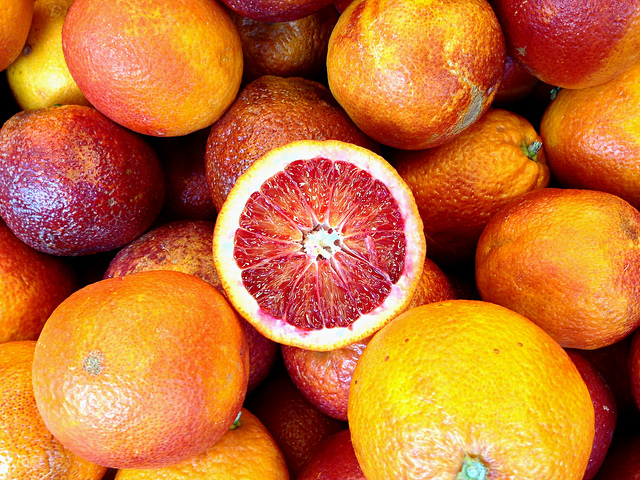

571 ,  Several kites are being flown in a large open field.


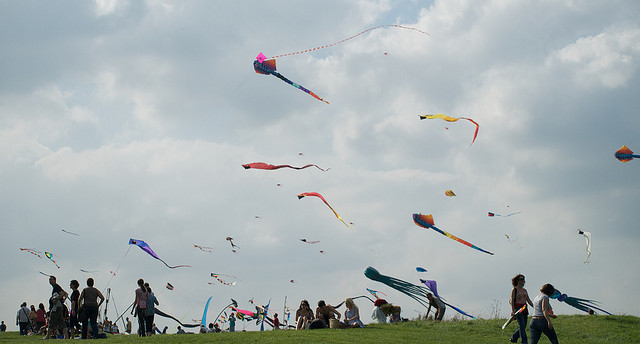

{'kites': 'kite'}


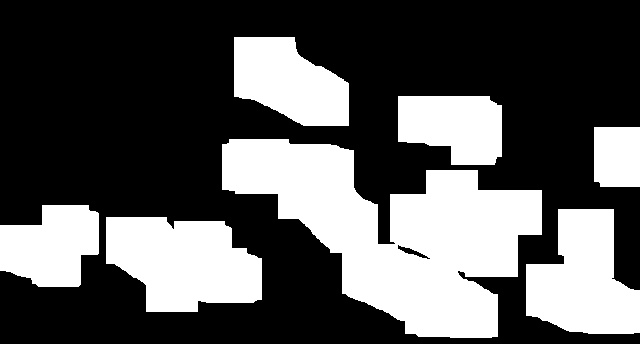

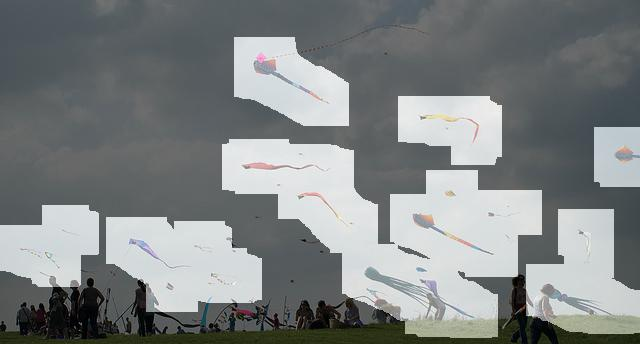

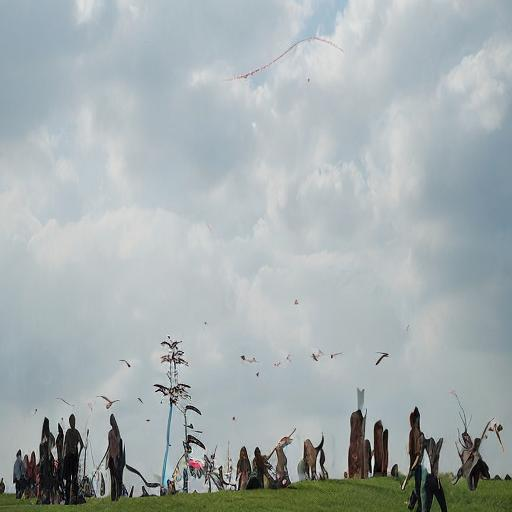

In [ ]:
# 测试:
# 选取一藏随机图片 in this batch

maskFolder = f"MasksFolder{start}-{start+batch_size-1}"
testMaskBlendFolder = f"MaskBlendTestingFolder{start}-{start+batch_size-1}"
outputFolder = f"DualImageFolder{start}-{start+batch_size-1}"

import random

while True:
  idx = random.randint(0, len(image_caption_pairs)-1)
  img_path_test, img_ID_test, caption_test, caption_id_test = image_caption_pairs[idx]
  print(idx, ', ', caption_test)
  image = Image.open(img_path_test)
  display(image)
  keyword_class_map = caption_data[idx]
  if (len(keyword_class_map) > 0):
    break

print(keyword_class_map)

for keyword, label in keyword_class_map.items():
    mask_filename = f"{img_ID_test}-{label}.jpg"
    mask_path = os.path.join(maskFolder, mask_filename)
    mask = Image.open(mask_path)
    display(mask)
    blend_path = os.path.join(testMaskBlendFolder, mask_filename)
    blend = Image.open(blend_path)
    display(blend)
    diffsion = Image.open(os.path.join(outputFolder, mask_filename))
    display(diffsion)



# Step 4. Dual caption

In [ ]:
for i in range(len(image_caption_pairs)):
  print(i, str(image_caption_pairs[i]) + ',')
len(image_caption_pairs)

0 ('train2014/COCO_train2014_000000341245.jpg', 341245, 'A train is coming up on another train next to it.', 493114),
1 ('train2014/COCO_train2014_000000521150.jpg', 521150, 'A passenger train moves along rails next to apartment buildings.', 37171),
2 ('train2014/COCO_train2014_000000568955.jpg', 568955, 'This train was photographed from an aerial view.', 654417),
3 ('train2014/COCO_train2014_000000393602.jpg', 393602, 'A train with a brown engine is on a train track.', 11333),
4 ('train2014/COCO_train2014_000000576543.jpg', 576543, 'Trains passing on tracks near city area on cloudy day.', 422964),
5 ('train2014/COCO_train2014_000000092639.jpg', 92639, 'Check the phone to see if anyone has called.', 286404),
6 ('train2014/COCO_train2014_000000521132.jpg', 521132, 'Intersection street signs displaying Plaza Drive and Coe Avenue.', 40440),
7 ('train2014/COCO_train2014_000000573988.jpg', 573988, 'A street sign on the edge of a curb has a sign with a monkey in Spanish, a handicap sign, and

1000

In [ ]:
for i in range(len(caption_data)):
  print(i, str(caption_data[i]) + ',')

0 {'train': 'train'},
1 {'passenger train': 'train'},
2 {'train': 'train'},
3 {'train': 'train'},
4 {'trains': 'train', 'tracks': 'train'},
5 {},
6 {},
7 {},
8 {},
9 {'traffic light': 'traffic light'},
10 {},
11 {},
12 {},
13 {},
14 {},
15 {},
16 {},
17 {},
18 {'tracks': 'train'},
19 {'station': 'train'},
20 {'train': 'train'},
21 {'train': 'train'},
22 {},
23 {'train': 'train'},
24 {'train': 'train'},
25 {'stop sign': 'stop sign'},
26 {'train': 'train'},
27 {'train': 'train'},
28 {'train': 'train', 'kid': 'person'},
29 {'trains': 'train', 'tracks': 'train', 'railroad': 'train', 'station': 'train'},
30 {'train': 'train'},
31 {},
32 {'trains': 'train'},
33 {'parking meter': 'parking meter'},
34 {'trains': 'train'},
35 {'train': 'train', 'man': 'person'},
36 {'train': 'train'},
37 {'soldiers': 'person'},
38 {'truck': 'truck'},
39 {'trucks': 'truck'},
40 {'stop light': 'traffic light', 'brake lights': 'traffic light', 'truck': 'truck'},
41 {},
42 {'tractor trailer': 'truck'},
43 {'girl': 

## prompt

In [ ]:
from langchain.prompts import ChatPromptTemplate, HumanMessagePromptTemplate
from langchain_core.messages import SystemMessage

openai_api_key = input("Input your API key")
assert openai_api_key.startswith(openai_api_key)

eval_chat_model = ChatOpenAI(
    model="gpt-4o-mini",
    temperature=0,
    openai_api_key=openai_api_key
)

REWRITE_PROMPT = """ Given a caption and a specific noun in it, your task is to rewrite the caption by removing the noun together with all its related words (such as active and passive behavior), from the caption.
Notice: Do not only remove the noun, but also all related words! Also, changing the noun to its synonym does not really work! It is okay to be short.

Below are three example I made:
(1)Caption: "A black and white image of a man in a suit wearing glasses walking through a door.",
	 keyword: "man",
	 Rewritten caption: "A black and white image of a door.",
(2)Caption: "An officer in a reflective vest stands at the front of his van with his dog."
	 keyword: "officer",
	 Rewritten caption: "There is a dog at the front of a van."
(3)Caption: "A man preparing desserts in a kitchen covered in frosting."
   keyword: "man"
   Rewritten caption: "Some desserts in a kitchen covered in frosting."
   *Remark*: Do not rewrite as "Desserts being prepared in a kitchen covered in frosting.", since "prepare" is related to the man.

Now you do it:
Original Caption: "{caption}"
Remove Noun: "{noun}"

Rewritten Caption:"""

rewrite_prompt_template = ChatPromptTemplate.from_messages([
    SystemMessage(content="You rewrite image captions by dropping the specified noun."),
    HumanMessagePromptTemplate.from_template(REWRITE_PROMPT)
])

## get

In [ ]:
# output container
dual_caption_data = []

for j in range(batch_size):
    entry = caption_data[j]
    orig = image_caption_pairs[j][2]  # Get original caption
    noun_map = entry  # recall: this is a dict: noun -> yolo_category
    # if noun_map empty then we ignore this entry
    if not noun_map:
        dual_caption_data.append({"original_caption": orig,
        "original_caption_id": image_caption_pairs[j][3],
        "original_imd_id": image_caption_pairs[j][1],
        "rewrites": []})
        continue
    # Collect rewrites for this caption.
    rewrites = []
    for noun in noun_map.keys():
        messages = rewrite_prompt_template.format_messages(
            caption=orig,
            noun=noun
        )
        try:
            resp = eval_chat_model.invoke(messages)
            text = resp.content.strip()
            rewrites.append({
                "removed_noun": noun,
                "removed_noun_category": noun_map[noun],
                "rewritten_caption": text
            })
        except Exception as e:
            print(f"Error rewriting '{orig}' without '{noun}': {e}")

    # Store results
    dual_caption_data.append({
        "original_caption": orig,
        "original_caption_id": image_caption_pairs[j][3],
        "original_imd_id": image_caption_pairs[j][1],
        "rewrites": rewrites
    })

    # —— Grouped print right here ——
    print(f'\nOriginal Caption: "{orig}"')
    if rewrites:
        for i, rw in enumerate(rewrites, 1):
            print(f'For caption {j}, Dual_Caption {i} (removed “{rw["removed_noun"]}”): {rw["rewritten_caption"]}')
    else:
        print("  (no valid mapped nouns to remove)")
    print("-" * 60)


Error rewriting 'A train is coming up on another train next to it.' without 'train': Error code: 401 - {'error': {'message': 'Incorrect API key provided: sk-proj-********************************************************************************************************************************************************AwAA. You can find your API key at https://platform.openai.com/account/api-keys.', 'type': 'invalid_request_error', 'param': None, 'code': 'invalid_api_key'}}

Original Caption: "A train is coming up on another train next to it."
  (no valid mapped nouns to remove)
------------------------------------------------------------
Error rewriting 'A passenger train moves along rails next to apartment buildings.' without 'passenger train': Error code: 401 - {'error': {'message': 'Incorrect API key provided: sk-proj-********************************************************************************************************************************************************AwAA. You can find y

In [ ]:
print(len(dual_caption_data))
for i in range(len(dual_caption_data)):
  print(i, str(dual_caption_data[i]) + ',')

## Final 质量抽查

In [ ]:
# 测试:
# 选取一藏随机图片 in this batch
import random

maskFolder = f"MasksFolder{start}-{start+batch_size-1}"
testMaskBlendFolder = f"MaskBlendTestingFolder{start}-{start+batch_size-1}"
outputFolder = f"DualImageFolder{start}-{start+batch_size-1}"


while True:
  idx = random.randint(0, len(image_caption_pairs) - 1)
  img_path_test, img_ID_test, caption_test, caption_id_test = image_caption_pairs[idx]
  print(idx, ', ', caption_test, ', ', img_ID_test)
  print(caption_test)
  keyword_class_map = caption_data[idx]
  if (len(keyword_class_map) > 0):
    print(idx, ', ', caption_test)
    image = Image.open(img_path_test)
    rewrites = dual_caption_data[idx]['rewrites']
    break



# Load original image
original_image = Image.new("RGB", (256, 256), color="gray")
width, height = original_image.size
if os.path.exists(img_path_test):
    original_image = Image.open(img_path_test).convert("RGB")

# Setup the grid
n_rows = len(keyword_class_map) + 1
fig, axs = plt.subplots(n_rows, 4, figsize=(15, 4 * n_rows))
if n_rows == 1:
    axs = [axs]
plt.subplots_adjust(wspace=0.1)  # 越小列间距越窄，推荐范围：0.1 ~ 0.3
plt.subplots_adjust(wspace=0.2)

# First row: Original caption and image
axs[0][0].text(0.5, 0.5, caption_test, ha='center', va='center', wrap=True, bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.7, edgecolor='none'), fontsize=18)
axs[0][0].set_title("Original Caption",fontsize=15, fontweight='bold')
axs[0][0].axis("off")
axs[0][0].set_aspect('auto')

axs[0][1].imshow(original_image)
axs[0][1].set_title("Original Image",fontsize=15, fontweight='bold')
axs[0][1].axis("off")
#axs[0][1].set_anchor('C')      # 居中对齐
axs[0][0].set_aspect('auto')

for j in range(2, 4):
    axs[0][j].axis("off")

# Populate for each keyword
for i, (keyword, label) in enumerate(keyword_class_map.items(), start=1):
    mask_filename = f"{img_ID_test}-{label}.jpg"
    # Rewritten caption
    matching_rewrite = next((r["rewritten_caption"] for r in rewrites if r["removed_noun_category"] == label), "N/A")
    print(matching_rewrite)
    axs[i][0].text(0.5, 0.5, matching_rewrite, ha='center', va='center', wrap=True, fontsize=18, bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.7, edgecolor='none'))
    axs[i][0].set_title(f"Rewritten (removed: {label})", fontsize=15, fontweight='bold')
    axs[i][0].axis("off")
    axs[0][0].set_aspect('auto')
    #axs[i][0].set_anchor('C')      # 居中对齐

    # Mask
    mask_path = os.path.join(maskFolder, mask_filename)
    if os.path.exists(mask_path):
        mask = Image.open(mask_path)
        axs[i][1].imshow(mask)
        axs[i][1].set_title(f"Mask, {keyword} -> {label}",fontsize=15, fontweight='bold')
    axs[i][1].axis("off")
    axs[0][0].set_aspect('auto')
    #axs[i][1].set_anchor('C')      # 居中对齐

    # Blend
    blend_path = os.path.join(testMaskBlendFolder, mask_filename)
    if os.path.exists(blend_path):
        blend = Image.open(blend_path)
        axs[i][2].imshow(blend)
        axs[i][2].set_title("Blended",fontsize=15, fontweight='bold')
    axs[i][2].axis("off")
    axs[0][0].set_aspect('auto')
    #axs[i][2].set_anchor('C')      # 居中对齐

    # Diffused image
    diff_path = os.path.join(outputFolder,mask_filename)
    print(diff_path)
    if os.path.exists(diff_path):
        diff = Image.open(diff_path)
        axs[i][3].imshow(diff)
        axs[i][3].set_title("Diffused",fontsize=15, fontweight='bold')
    axs[i][3].axis("off")
    axs[0][0].set_aspect('auto')
    #axs[i][3].set_anchor('C')      # 居中对齐
plt.tight_layout()
plt.show()



# 后续: 保存数据为 coco 格式, 自定义格式以及下载

fucking google colab 不能下载文件夹, 逆天

## 输出1: 把输出文件夹打 zip 直接 download

In [ ]:
import shutil

shutil.make_archive(f'DualImageFolder{start}-{start+batch_size-1}', 'zip', f'DualImageFolder{start}-{start+batch_size-1}')
shutil.make_archive(f'MasksFolder{start}-{start+batch_size-1}', 'zip', f'MasksFolder{start}-{start+batch_size-1}')
shutil.make_archive(f'MaskBlendTestingFolder{start}-{start+batch_size-1}', 'zip', f'MaskBlendTestingFolder{start}-{start+batch_size-1}')

In [ ]:
from google.colab import files
files.download(f'DualImageFolder{start}-{start+batch_size-1}.zip')
files.download(f'MasksFolder{start}-{start+batch_size-1}.zip')
files.download(f'MaskBlendTestingFolder{start}-{start+batch_size-1}.zip')

## 输出 2: 整合成本次训练需要的格式, 不用原图片, 只需要 dual image + dual caption

In [ ]:
# Output dictionaries
new_images_paths: dict[int, list[str]] = {}
new_captions: dict[int, list[str]] = {}

# Populate dictionaries
for j, (img_path, img_ID, caption, caption_id) in enumerate(image_caption_pairs):
    i = j+start
    labels = caption_data[j]
    new_images_paths[i] = [f"DualImageFolder{start}-{start+batch_size-1}/{img_ID}-{label}.jpg" for label in labels.values()]
    new_captions[i] = []
    for rewrite in dual_caption_data[j]["rewrites"]:
        label = rewrite["removed_noun_category"]
        rewritten_caption = rewrite["rewritten_caption"].strip('"')
        img_id = int(new_images_paths[i][0].split("/")[1].split("-")[0])  # Extract image ID from path
        new_captions[i].append(rewritten_caption)



# Load and merge with existing dual_images.json
if os.path.exists("dual_images_paths.json"):
    with open("dual_images_paths.json", "r") as f:
        dual_images = json.load(f)
        dual_images = {int(k): v for k, v in dual_images.items()}
else:
    dual_images = {}

dual_images.update(new_images_paths)

# Load and merge with existing dual_captions.json
if os.path.exists("dual_captions.json"):
    with open("dual_captions.json", "r") as f:
        dual_captions = json.load(f)
        dual_captions = {int(k): v for k, v in dual_captions.items()}
else:
    dual_captions = {}

dual_captions.update(new_captions)

# Save updated results
with open("dual_images_paths.json", "w") as f:
    json.dump(dual_images, f, indent=2)

with open("dual_captions.json", "w") as f:
    json.dump(dual_captions, f, indent=2)



In [ ]:
dual_images

Notice:

1. 每条 caption 和 true_image 是一一对应的 true examples.
2. 每条 caption 和其所有 neg_images 都是对应的 false examples.
3. 每条 dual_caption 和 neg_image 都是一一对应的 true examples.
(4. 注意: 每条 dual_caption 和 true_image 的关系没有 true/false 性, 严格而言, dual_caption 是对 true_image 的简化描述.)


In [ ]:
files.download('dual_images_paths.json')
files.download('dual_captions.json')
dual_images